
# Assignment 

1.Name: Vaishnavi Bhoite

2.NUID: 002776319

## Abstract:
This assignment involves the analysis of the water potability dataset for predictive learning purposes. The dataset contains data on water samples collected from various sources to determine if the water is safe to drink. The data is examined for quality, consistency, completeness, and the key features that are important for predicting water potability are identified. Several questions are answered in the analysis, including the data types, missing values, likely distributions of numeric variables, important independent variables for predicting the target variable, and the impact of removing outliers and missing data. The objective is to build a classifier model, a regression model, and an H20 AutoML model to find the optimal model for the dataset. SHAP analysis is performed on all models to interpret the results. The linear regression and random forest classifier models are found to be useful in predicting and analyzing water potability to some extent, although there is room for improvement using more advanced machine learning techniques. Overall, the findings from this analysis can be used to develop models that predict water potability and provide insights into the factors that influence water quality.

##Dataset
This dataset has a water_potability.csv file which contains water quality metrics for 3276 different water bodies.

Content:




*   ph Value: When assessing the acid-base equilibrium of water, PH is a key factor. Additionally, it shows whether the water is acidic or neutral. The highest pH allowed range, according to WHO, is between 6.5 and 8.5. The present investigation's ranges fell between 6.52 and 6.83, which is within WHO standards.

*   Hardness: Salts made of calcium and magnesium are the primary culprits in hardness. These salts are released from the geologic layers that water passes through. How long water is exposed to a hardness-producing substance influences how hard the water is when it is in its natural state. The ability of water to form soap due to calcium and magnesium precipitation was the initial definition of hardness.

*   Solids(Total dissolved solids -TDS):Numerous inorganic and some organic elements or salts, including potassium, calcium, sodium, bicarbonates, chlorides, magnesium, sulfates, and others, can be dissolved by water. These minerals gave the water an undesirable flavor and diluted hue. This is a crucial variable when using water. Water with a high TDS rating is one that has a high mineral content. The recommended TDS limit for drinking purposes is 500 mg/l, with a highest limit of 1000 mg/l.

*   Chloramines:The two main disinfectants used in public water networks are chlorine and chloramine. When ammonia is added to chlorine to treat drinking water, chloramines are most frequently produced. Drinking water can contain up to 4 mg/L of chlorine (or 4 ppm), which is regarded as a safe amount.

*   Sulfate:Sulfates are organic compounds that are typically present in rocks, soil, and minerals. They can be found in the surrounding environment, groundwater, vegetation, and food. Sulfate is primarily used in the chemical business for commercial purposes. The amount of sulfate in saltwater is approximately 2,700 mg/L. The majority of freshwater supplies have concentrations between 3 and 30 mg/L, but some regions have much greater levels (1000 mg/L).
*   Conductivity: Pure water is an excellent insulator rather than a good conductor of electrical current. The electrical conductivity of water is improved by an increase in ion content. The electrical conductivity of water is typically determined by the quantity of dissolved solids present. The ability of a solution to transmit electricity through its ionic process is measured by electrical conductivity (EC). According to WHO guidelines, the EC number shouldn't be higher than 400 S/cm.


*  Organic carbon :The decaying natural organic matter (NOM) and synthetic sources both contribute to the total organic carbon (TOC) in source waterways. The total quantity of carbon (TOC) in organic compounds in pure water is a measurement of this. US EPA estimates that treated potable water contains 2 mg/L of TOC and that source water, which is used for treatment, contains 4 mg/Lit.



*   Trihalomethanes:Chemicals called THMs can be detected in chlorine-treated water. The amount of organic matter in the water, the quantity of chlorine needed to clean the water, and the temperature of the treated water all affect the concentration of THMs in drinking water. THM concentrations up to 80 ppm are regarded as harmless for drinking water.



*  Turbidity: The amount of solid matter existing in the suspended state determines how turbid the water is. The test is used to determine the purity of waste discharge with regard to colloidal matter and measures the light-emitting properties of water. The Wondo Genet Campus's mean turbidity value (0.98 NTU) is less than the WHO-recommended value of 5.00 NTU.


*   
Potability: Indicates if water is safe for human consumption where 1 means Potable and 0 means Not potable.






















# Importing all the libraries required

In [3]:
#importing all the important libraries
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import numpy as np
import pandas as pd
import random
import os
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from scipy.stats import skew, norm
from scipy import stats
from scipy.stats import norm, skew 
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
import xgboost as xgb
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
from yellowbrick.regressor import ResidualsPlot

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

pd.set_option('display.max_columns', None)

from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
import scipy
from sklearn.impute import KNNImputer


import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np

#%%capture
#this library can be used for validation as well as visualization of data 
#!pip install -q tensorflow_data_validation[visualization]

In [4]:
pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107747 sha256=46af84827f92df96097c51347cf0edf22c054d923c3773f07bbdc8c7c4ef9c1e
  Stored in directory: /root/.cache/pip/wheels/7b/26/a5/8460416695a992a2966b41caa5338e5e7fcea98c9d032d055c
Successfully built eli5


In [5]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot


# Reading the Dataset

In [6]:
data = pd.read_csv("https://raw.githubusercontent.com/Vaishnavi200029/Water_Potability/main/water_potability.csv")  # Reading CSV file into Pandas DataFrame


In [7]:
data

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1
3272,7.808856,193.553212,17329.802160,8.061362,NaN,392.449580,19.903225,NaN,2.798243,1
3273,9.419510,175.762646,33155.578218,7.350233,NaN,432.044783,11.039070,69.845400,3.298875,1
3274,5.126763,230.603758,11983.869376,6.303357,NaN,402.883113,11.168946,77.488213,4.708658,1


10 physical characteristics of Water Potability dataset i.e. ph,	Hardness,	Solids,	Chloramines	,Sulfate,	Conductivity,	Organic carbon	,Trihalomethanes and	Turbidity	 - The Independent variables and Potability - The dependent variable

There are a total of 3276 observations.

## What are the data types? (Only numeric and categorical)
This dataset consists of only numeric data

In [8]:
data.shape

(3276, 10)

In [9]:
data.isna().head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,True,False,False,False,False,False,False,False,False,False
1,False,False,False,False,True,False,False,False,False,False
2,False,False,False,False,True,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False


# Which independent variables have missing data? How much?

In [10]:
data.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

Based on the dataset , the independent variables that have missing data and the number of missing values are:
ph-491 missing values, Sulfate-781 missing values and Trihalomethanes 162 missing values.


* Are there missing values?
yes there are missing values in ph, chloramines and trihalomethanes.

# Data cleaning

In [11]:
data = data.dropna()

In [12]:
nanValues = data.isna()
nanColumns = nanValues.any()
columnsWithNan = data.columns[nanColumns].tolist()
print(columnsWithNan)

[]


In [13]:
from pandas.core.series import FillnaOptions
FillnaOptions = data.fillna(0)

In [14]:
data1 = data.fillna(0)

In [15]:
data.fillna(0,inplace=True)

In [16]:
data["ph"] = data["ph"].fillna(0)

In [17]:
data["ph"] = data["ph"].replace(np.nan, 0)

In [18]:
data1 = data.replace(np.nan, 0)

In [19]:
data1.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0


In [20]:
mean_imputed = data.fillna(data.mean())
mean_imputed.head(10)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0
9,11.180284,227.231469,25484.508491,9.077200,404.041635,563.885481,17.927806,71.976601,4.370562,0
10,7.360640,165.520797,32452.614409,7.550701,326.624353,425.383419,15.586810,78.740016,3.662292,0
12,7.119824,156.704993,18730.813653,3.606036,282.344050,347.715027,15.929536,79.500778,3.445756,0
15,6.347272,186.732881,41065.234765,9.629596,364.487687,516.743282,11.539781,75.071617,4.376348,0
17,9.181560,273.813807,24041.326280,6.904990,398.350517,477.974642,13.387341,71.457362,4.503661,0


# How are the values distributed?

For this we can use the .describe() method.

In [21]:
data.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,3.969729,0.403282
std,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,0.780346,0.490678
min,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,1.450000,0.000000
25%,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,3.442915,0.000000
50%,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,3.968177,0.000000
75%,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,4.514175,1.000000
max,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,6.494749,1.000000


Above we get a general description of numeric data which mentions the mean, standard deviation, min value, max value etc.

##  What are the likely distributions of the numeric variables?

*  
Hardness: The mean and median (50th percentile) are quite close to each other, indicating that the distribution is likely to be roughly symmetric. The range of values is quite large, and there is some variability in the data, as indicated by the standard deviation. It's possible that the distribution is normal or close to normal, but it's also possible that it is skewed.

*   
Solids: The mean is larger than the median, which suggests that the distribution is skewed to the right. The range of values is quite large, and there is also a lot of variability in the data, as indicated by the standard deviation. It's possible that the distribution is log-normal, as some water quality variables are known to follow this type of distribution.
*   Chloramines: The mean and median are quite close to each other, indicating that the distribution is likely to be roughly symmetric. The standard deviation is relatively small compared to the mean, which suggests that the data is relatively tightly clustered around the mean. It's possible that the distribution is normal or close to normal.

*   Sulfate: The mean and median are quite close to each other, indicating that the distribution is likely to be roughly symmetric. The range of values is not as large as for some of the other variables, and there is not as much variability in the data, as indicated by the standard deviation. It's possible that the distribution is normal or close to normal.

*   Conductivity: The mean is larger than the median, which suggests that the distribution is skewed to the right. The range of values is quite large, and there is also a lot of variability in the data, as indicated by the standard deviation. It's possible that the distribution is log-normal.
*  Organic_carbon: The mean and median are quite close to each other, indicating that the distribution is likely to be roughly symmetric. The range of values is not as large as for some of the other variables, and there is not as much variability in the data, as indicated by the standard deviation. It's possible that the distribution is normal or close to normal.

*   Trihalomethanes: The mean is larger than the median, which suggests that the distribution is skewed to the right. The range of values is not as large as for some of the other variables, and there is not as much variability in the data, as indicated by the standard deviation. It's possible that the distribution is log-normal.
*   Turbidity: The mean and median are quite close to each other, indicating that the distribution is likely to be roughly symmetric. The range of values is not as large as for some of the other variables, and there is not as much variability in the data, as indicated by the standard deviation. It's possible that the distribution is normal or close to normal.






















# What are the distributions of the predictor variables?

<Figure size 800x500 with 0 Axes>

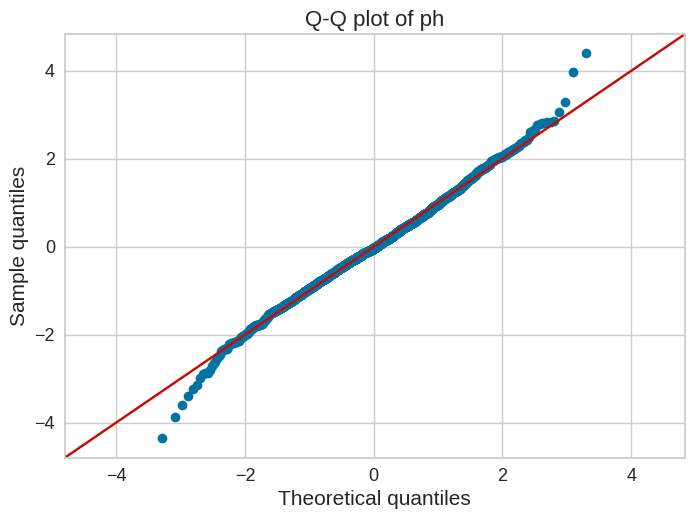

<Figure size 800x500 with 0 Axes>

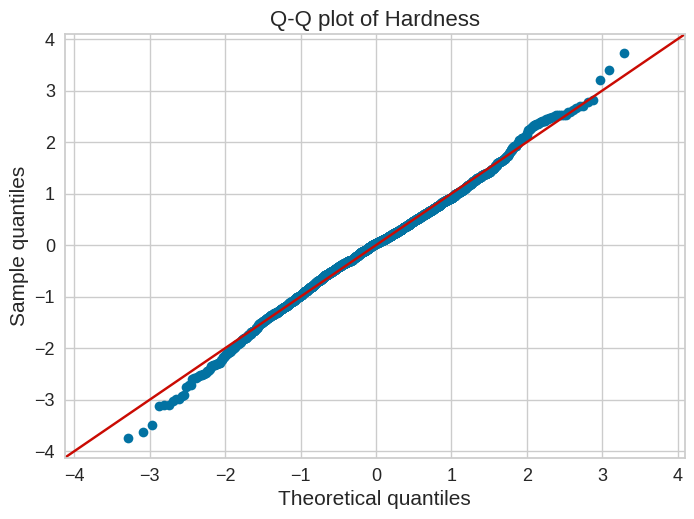

<Figure size 800x500 with 0 Axes>

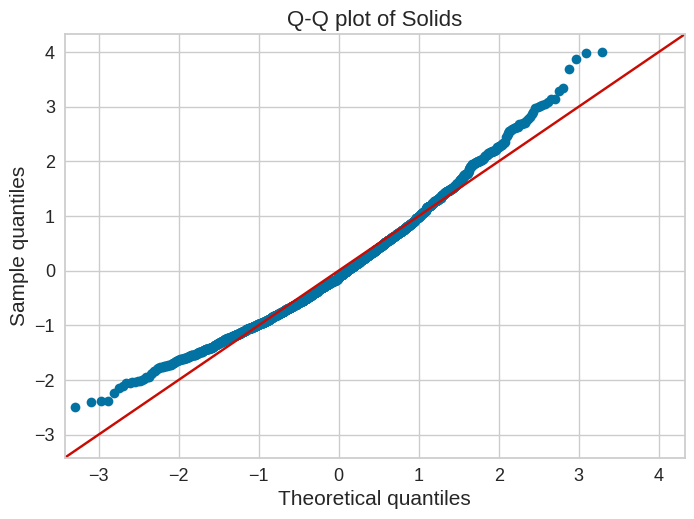

<Figure size 800x500 with 0 Axes>

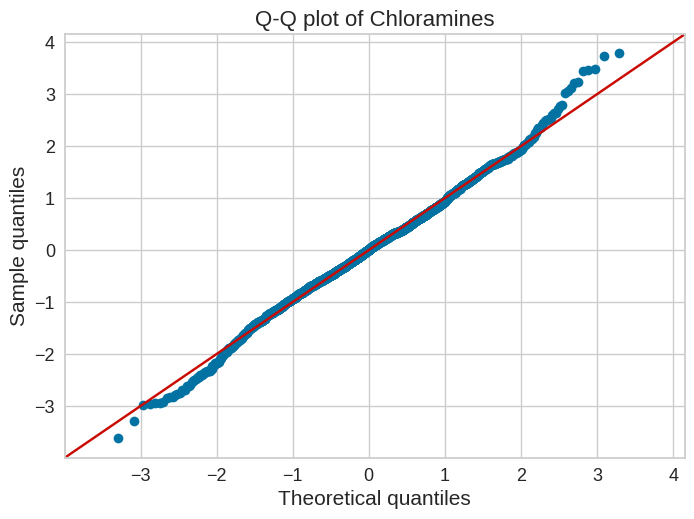

<Figure size 800x500 with 0 Axes>

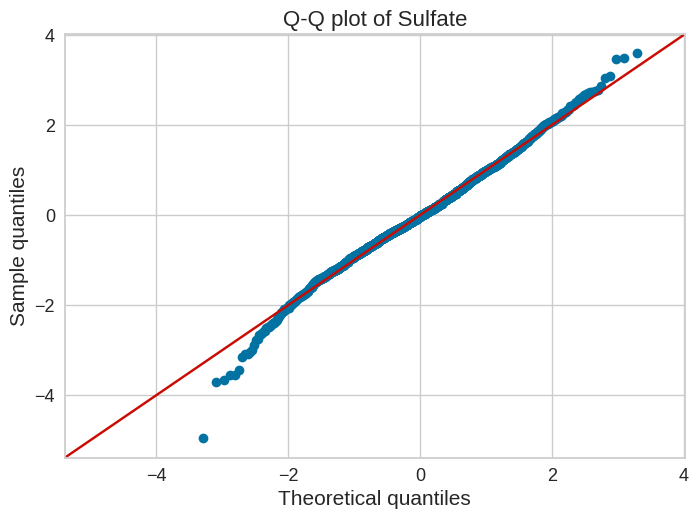

<Figure size 800x500 with 0 Axes>

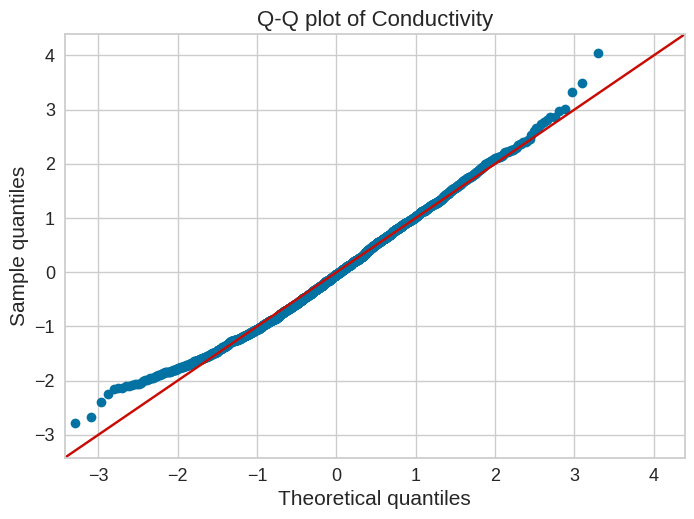

<Figure size 800x500 with 0 Axes>

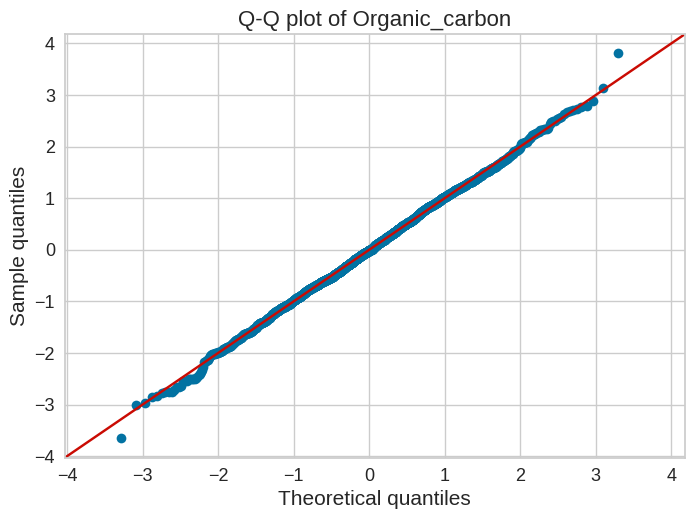

<Figure size 800x500 with 0 Axes>

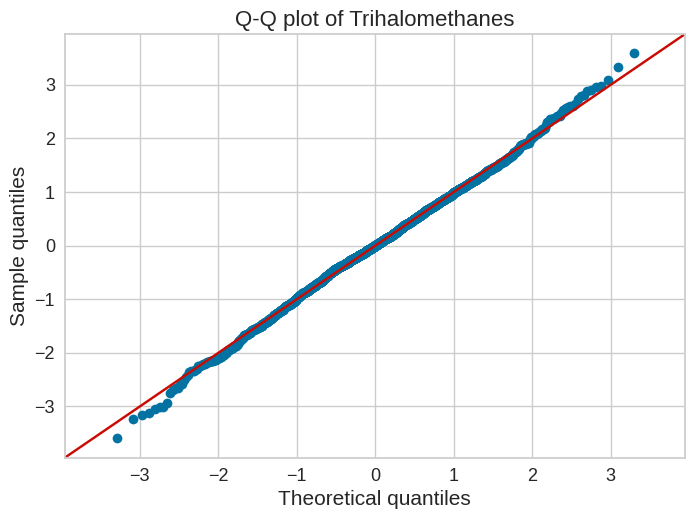

<Figure size 800x500 with 0 Axes>

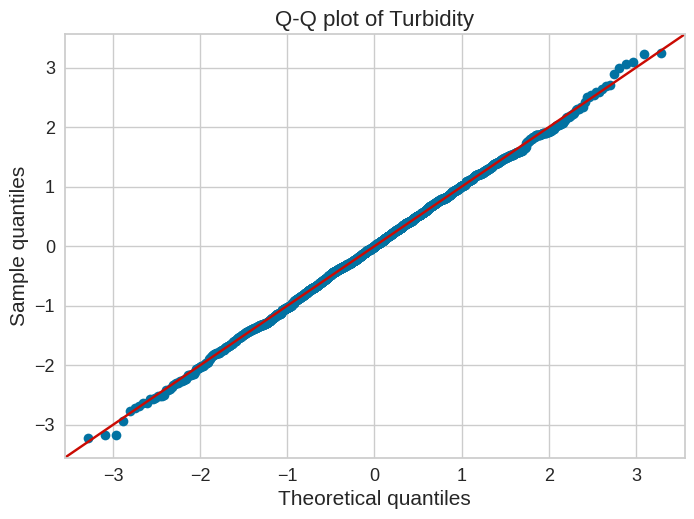

<Figure size 800x500 with 0 Axes>

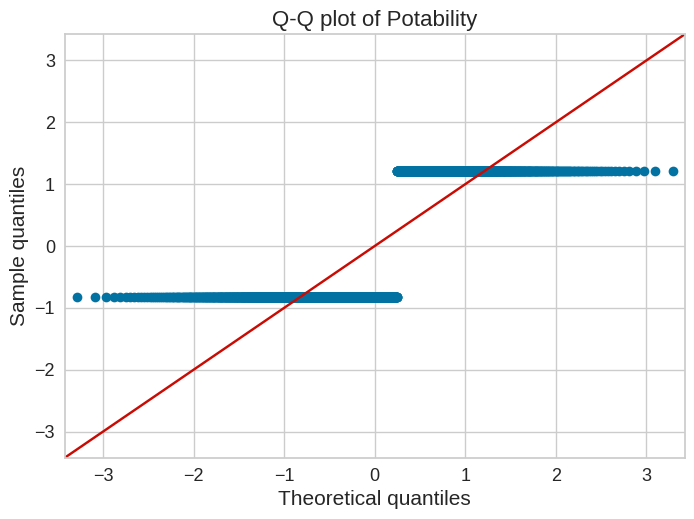

In [22]:
from statsmodels.graphics.gofplots import qqplot
data_norm=data[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability']]
for c in data_norm.columns[:]:
  plt.figure(figsize=(8,5))
  fig=qqplot(data_norm[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

# Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)

# 1st Method :
By using correlations we can see that certain values have a higher importance. To better visualize this we will use heatmap.

In [23]:
data_norm.corr()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.108948,-0.087615,-0.024768,0.010524,0.014128,0.028375,0.018278,-0.035849,0.014530
Hardness,0.108948,1.000000,-0.053269,-0.022685,-0.108521,0.011731,0.013224,-0.015400,-0.034831,-0.001505
Solids,-0.087615,-0.053269,1.000000,-0.051789,-0.162769,-0.005198,-0.005484,-0.015668,0.019409,0.040674
Chloramines,-0.024768,-0.022685,-0.051789,1.000000,0.006254,-0.028277,-0.023808,0.014990,0.013137,0.020784
Sulfate,0.010524,-0.108521,-0.162769,0.006254,1.000000,-0.016192,0.026776,-0.023347,-0.009934,-0.015303
Conductivity,0.014128,0.011731,-0.005198,-0.028277,-0.016192,1.000000,0.015647,0.004888,0.012495,-0.015496
Organic_carbon,0.028375,0.013224,-0.005484,-0.023808,0.026776,0.015647,1.000000,-0.005667,-0.015428,-0.015567
Trihalomethanes,0.018278,-0.015400,-0.015668,0.014990,-0.023347,0.004888,-0.005667,1.000000,-0.020497,0.009244
Turbidity,-0.035849,-0.034831,0.019409,0.013137,-0.009934,0.012495,-0.015428,-0.020497,1.000000,0.022682
Potability,0.014530,-0.001505,0.040674,0.020784,-0.015303,-0.015496,-0.015567,0.009244,0.022682,1.000000


<Axes: >

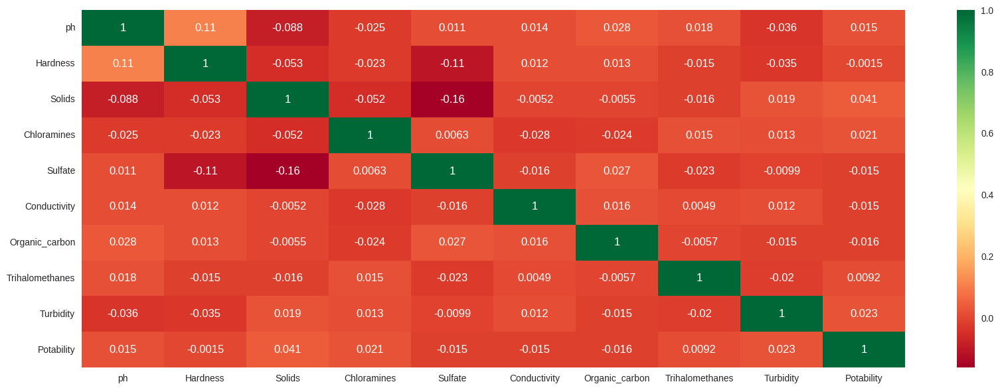

In [24]:
plt.figure(figsize=(20,7))
sns.heatmap(data_norm.corr(), annot=True, cmap='RdYlGn')


Text(0.5, 1.0, 'Variable Correlation')

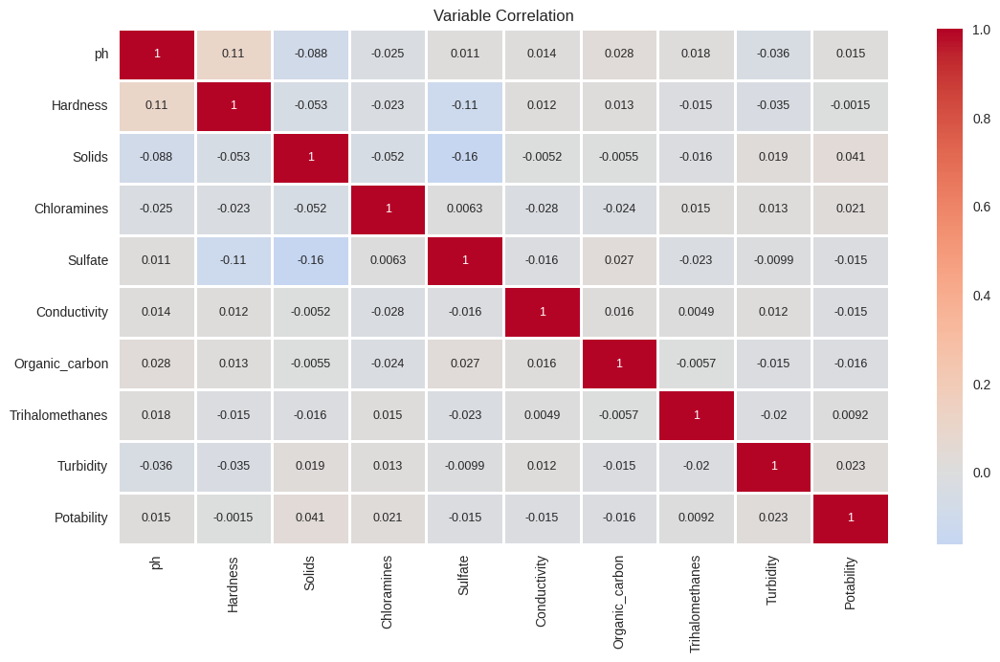

In [25]:
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(13,7))

sns.heatmap(data.corr(),center=0, linewidths=0.9,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

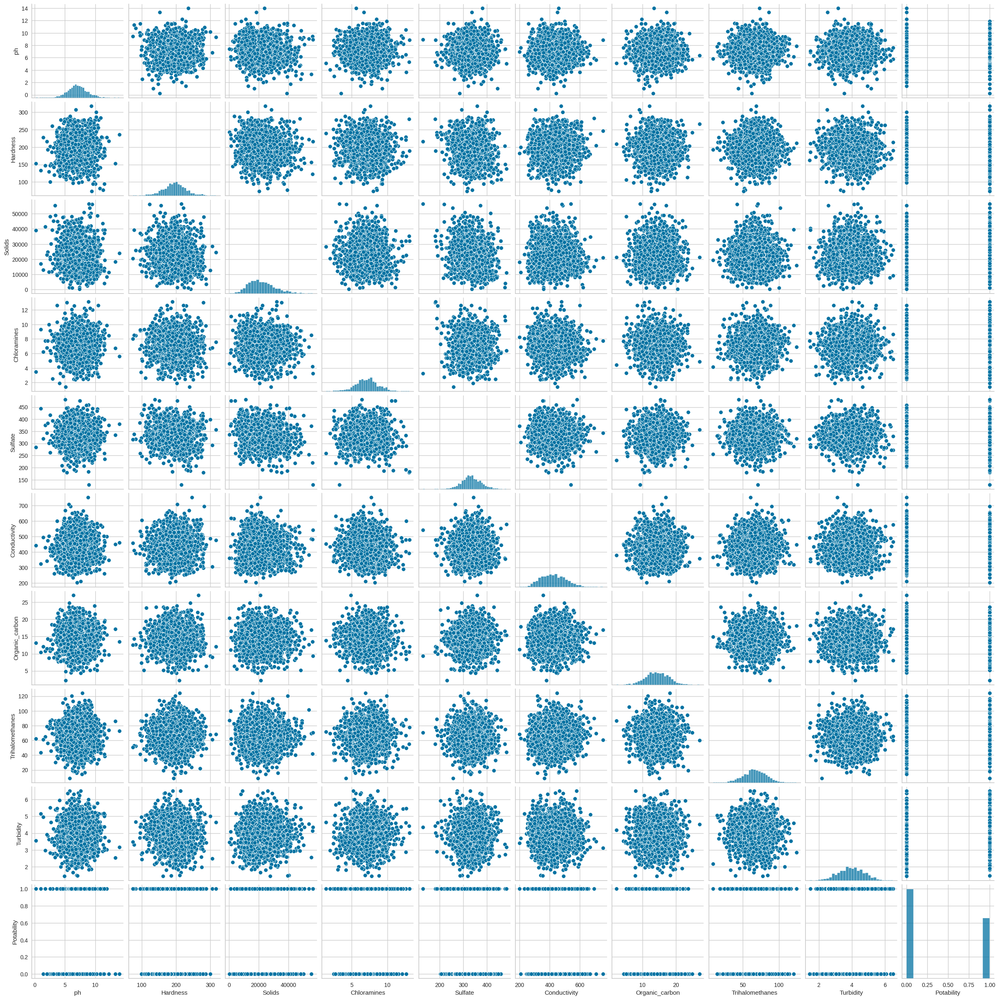

In [26]:
sns.pairplot(data_norm)

From this we can relate that Potability is more dependent on Conductivity than all the other variables.

# Identifing predictor significance

2nd Method :
By using model summary using ordinary least squared regression, we can see that higher T-statistic value gives more importance to the significance of the predictor variables.

In [27]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm
mean_imputed = data.fillna(data.mean())

model = sm.OLS(mean_imputed['Potability'], mean_imputed[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             Potability   R-squared (uncentered):                   0.405
Model:                            OLS   Adj. R-squared (uncentered):              0.402
Method:                 Least Squares   F-statistic:                              151.2
Date:                Mon, 10 Apr 2023   Prob (F-statistic):                   3.82e-218
Time:                        01:16:35   Log-Likelihood:                         -1418.8
No. Observations:                2011   AIC:                                      2856.
Df Residuals:                    2002   BIC:                                      2906.
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
ph                  0.0091      0.007      1.332      0.183      -0.004       0.022
Hardness            0.0002      0.000      0.731      0.465      -0.000       0.001
Solids           3.006e-06   1.23e-06      2.440      0.015     5.9e-07    5.42e-06
Chloramines         0.0103      0.007      1.564      0.118      -0.003       0.023
Sulfate             0.0002      0.000      0.695      0.487      -0.000       0.001
Conductivity    -2.187e-05      0.000     -0.170      0.865      -0.000       0.000
Organic_carbon     -0.0009      0.003     -0.266      0.790      -0.007       0.005
Trihalomethanes     0.0006      0.001      0.895      0.371      -0.001       0.002
Turbidity           0.0216      0.013      1.629      0.104      -0.004       0.048
==============================================================================
Omnibus:                     8186.307   Durbin-Watson:                   0.044
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              329.565
Skew:                           0.392   Prob(JB):                     2.73e-72
Kurtosis:                       1.178   Cond. No.                     2.86e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 2.86e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Method 3:
We can use model coefficiants to determine the importance of he varible. For this

We must first build our model
Fit the values of train on the model
And use model.coef_ to retrieve the coefficients.
# Building the Model
Train ,Validation and Test split

In [28]:
from sklearn.model_selection import  train_test_split

X = data[ ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']]

y = data['Potability']

#Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=1)

## * Do the training and test sets have the same data?
No, the training and test sets are not the same data. The code splits the data into three sets: training set, validation set, and test set. The training set is used to fit the model, while the validation set is used to tune the model's hyperparameters. Finally, the test set is used to evaluate the model's performance on unseen data

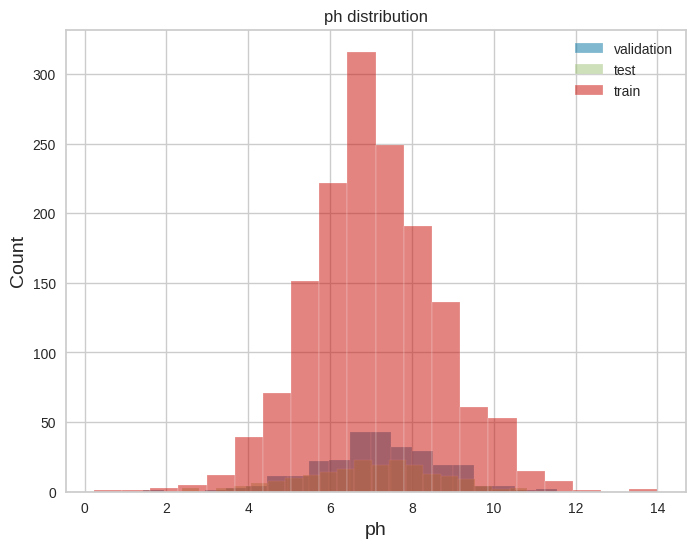

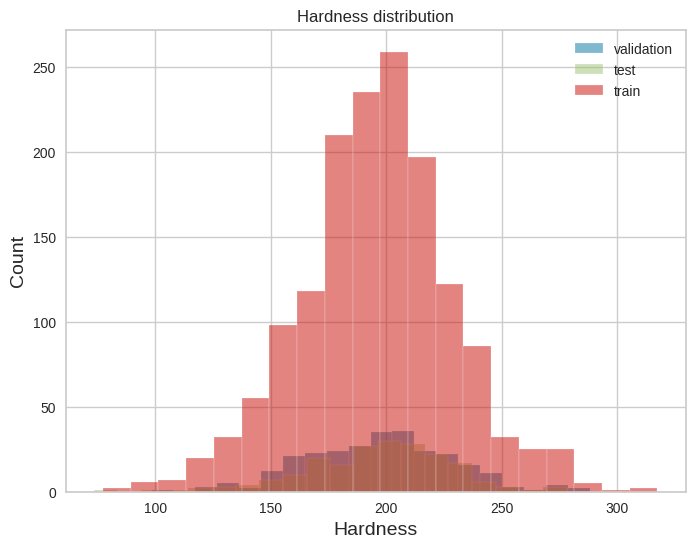

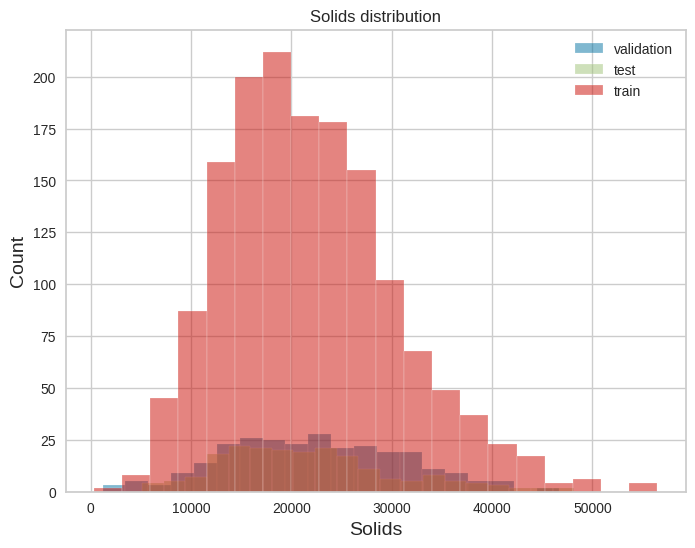

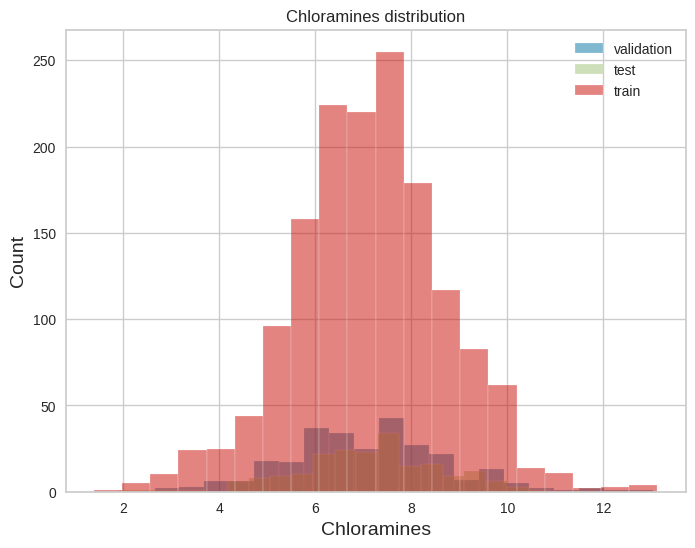

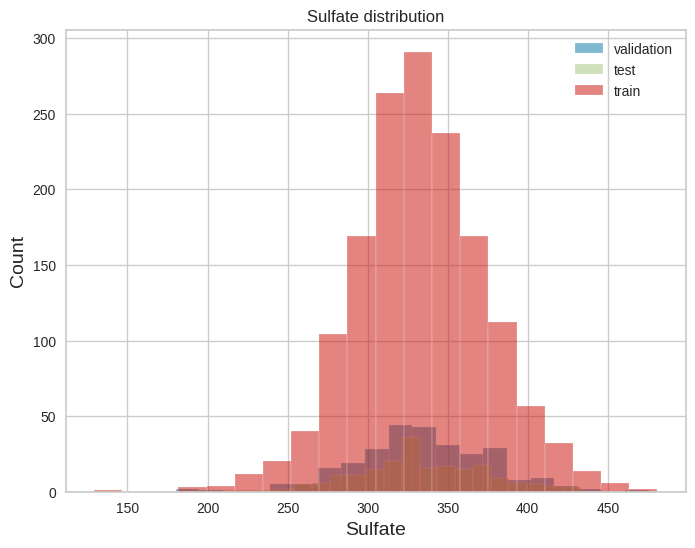

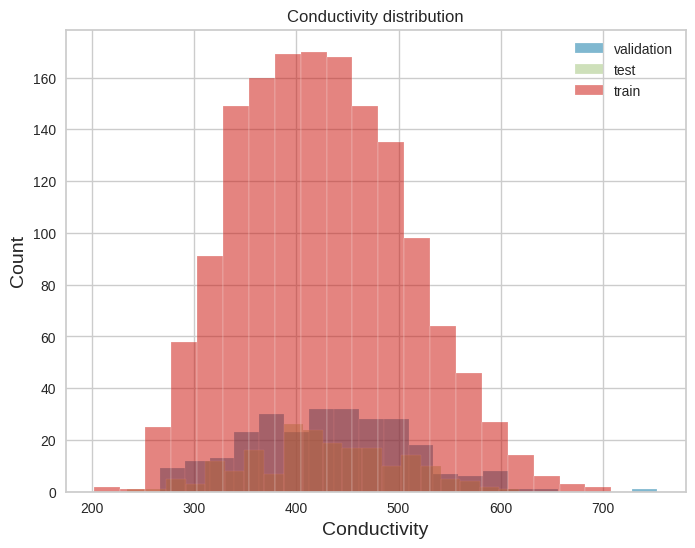

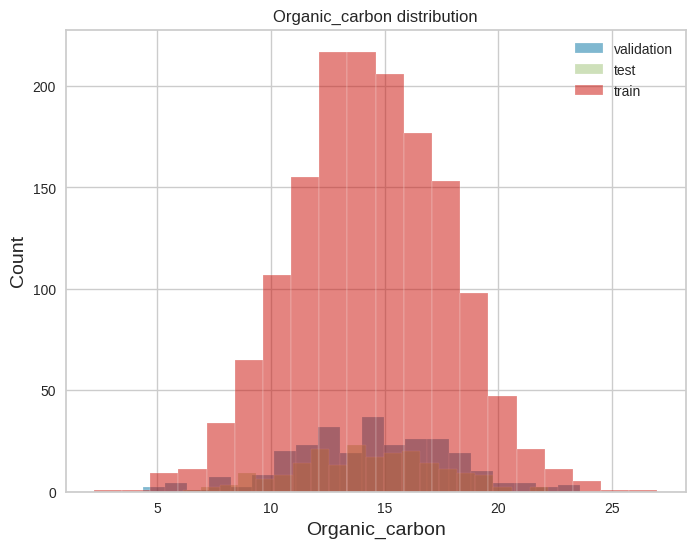

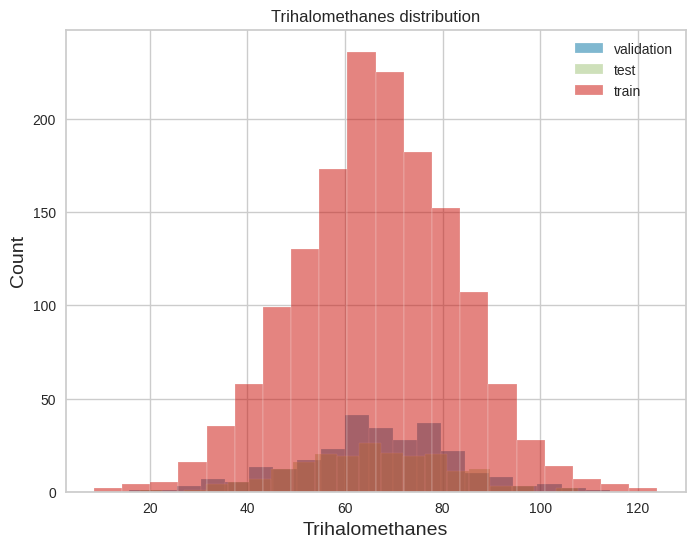

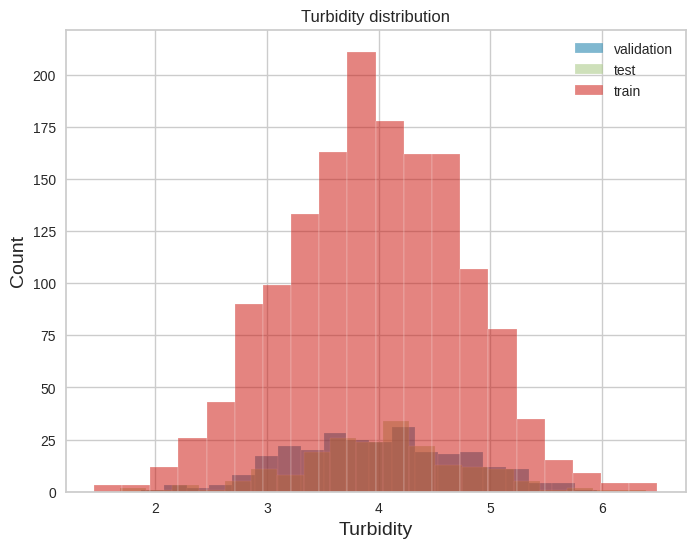

In [29]:
X_test_plot = X_test[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']]

X_val_plot = X_val[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']]

X_train_plot = X_train[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
  plt.figure(figsize=(8,6))
  plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
  plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
  plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
  plt.xlabel(c, size=14)
  plt.ylabel("Count", size=14)
  plt.legend(loc='upper right')
  plt.title("{} distribution".format(c))
  plt.show()

# Linear Regression

In [30]:
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

regr = linear_model.LinearRegression()
regr.fit(X_train,y_train)

y_predict = regr.predict(X_train)
print('Mean squared error is: {}'.format(mean_squared_error(y_train, y_predict)))

r2 = r2_score(y_train,y_predict)
print('R^2 score on tarining set =',r2)

Mean squared error is: 0.2404783005522739
R^2 score on tarining set = 0.003335995794079283


In [31]:
y_predict = regr.predict(X_test)
print('Mean squared error is: {}'.format(mean_squared_error(y_test, y_predict)))

r2 = r2_score(y_test,y_predict)
print('R^2 score on tarining set =',r2)

Mean squared error is: 0.23648908104298855
R^2 score on tarining set = -0.013091912113187165


In [32]:
y_predict = regr.predict(X_val)
print('Mean squared error is: {}'.format(mean_squared_error(y_val, y_predict)))

r2 = r2_score(y_val,y_predict)
print('R^2 score on tarining set =',r2)

Mean squared error is: 0.23992131588734514
R^2 score on tarining set = 0.006751797067352849


## Which predictor variables are the most important?
conductivity, ph, hardness and chloramines are the most important predictor variables.

## Is the predictor variables independent of all the other predictor variables?
No, the predictor variables may not be completely independent of each other. It is possible that there may be some correlation or relationship between the predictor variables, which can affect the accuracy and effectiveness of the model. It is important to check for multicollinearity and other issues in the data before building a model

# Understanding the Important Features

In [33]:
import eli5
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(regr, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0037 ± 0.0021,Conductivity
0.0032 ± 0.0058,ph
0.0011 ± 0.0017,Hardness
0.0010 ± 0.0052,Chloramines
0.0008 ± 0.0026,Organic_carbon
0.0006 ± 0.0016,Sulfate
-0.0008 ± 0.0007,Trihalomethanes
-0.0016 ± 0.0035,Turbidity
-0.0123 ± 0.0144,Solids


# Imputing Data for 1%, 5% and 10%
KNN Imputation

In [34]:
#Imputation using KNN, removed 5% of data 
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
data_mainImpute = data.copy(deep=True)
def removeRandomData(dataset, percent, col):
    dataset.loc[dataset.sample(frac = percent).index, col] = np.nan


data_mainImpute['Conductivity10'] = data_mainImpute['Conductivity']
data_mainImpute['Conductivity5'] = data_mainImpute['Conductivity']
data_mainImpute['Conductivity1'] = data_mainImpute['Conductivity']

removeRandomData(data_mainImpute, 0.10, 'Conductivity10')
removeRandomData(data_mainImpute, 0.05, 'Conductivity5')
removeRandomData(data_mainImpute, 0.01, 'Conductivity1')
print(data_mainImpute.isnull().sum())

ph                   0
Hardness             0
Solids               0
Chloramines          0
Sulfate              0
Conductivity         0
Organic_carbon       0
Trihalomethanes      0
Turbidity            0
Potability           0
Conductivity10     201
Conductivity5      101
Conductivity1       20
dtype: int64


## Making DataFrames

In [35]:
data_num1 = data_mainImpute[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate',  'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Conductivity1']]
data_num5 = data_mainImpute[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate',  'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Conductivity5']]
data_num10 = data_mainImpute[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate',  'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Conductivity10']]
data_og = data_mainImpute['Conductivity']

In [36]:
data_norm_Impute=data_norm.copy(deep= True)

In [37]:
from sklearn.metrics import accuracy_score
imputer = KNNImputer(n_neighbors=10)
### For the 1% imputation ###
imputer.fit_transform(data_num1)
imputed_number_df = pd.DataFrame(imputer.fit_transform(data_num1), columns = data_num1.columns)
print(imputed_number_df.isnull().sum())
imputed_number_df['Conductivity'] = data_og
imputed_number_df['orignalVimputed_01'] = data['Conductivity'].sub(imputed_number_df['Conductivity1'], axis = 0)

percent_change_1 = (imputed_number_df['orignalVimputed_01'].sum() / imputed_number_df['orignalVimputed_01'].count())*100
print("The perecent change of the orignal vs imputed value of 1% values is: {}".format(percent_change_1))


### For the 5% imputation ###
imputer.fit_transform(data_num5)
imputed_number_df = pd.DataFrame(imputer.fit_transform(data_num5), columns = data_num5.columns)
imputed_number_df['Conductivity'] = data_og
imputed_number_df['orignalVimputed_05'] = data['Conductivity'].sub(imputed_number_df['Conductivity5'], axis = 0)
percent_change_5 = (imputed_number_df['orignalVimputed_05'].sum() / imputed_number_df['orignalVimputed_05'].count())*100
print("The perecent change of the orignal vs imputed value of 5% values is: {}".format(percent_change_5))

### For the 10% imputation ###
imputer.fit_transform(data_num10)
imputed_number_df = pd.DataFrame(imputer.fit_transform(data_num10), columns = data_num10.columns)
imputed_number_df['Conductivity'] = data_og
imputed_number_df['orignalVimputed_10'] = data['Conductivity'].sub(imputed_number_df['Conductivity10'], axis = 0)
percent_change_10 = (imputed_number_df['orignalVimputed_10'].sum() / imputed_number_df['orignalVimputed_10'].count())*100
print("The perecent change of the orignal vs imputed value of 10% values is: {}".format(percent_change_10))



ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Conductivity1      0
dtype: int64
The perecent change of the orignal vs imputed value of 1% values is: 19.068682245457975
The perecent change of the orignal vs imputed value of 5% values is: -59.054686413289545
The perecent change of the orignal vs imputed value of 10% values is: -31.376561737332498


# Mean Imputation

In [38]:
### Specifying the imputer. ###
mean_imputer = SimpleImputer(missing_values=np.nan, strategy='mean')

### FOR the 1 % imputed values using Mean method ###
mean_imputer = mean_imputer.fit(data_num1)
results = mean_imputer.transform(data_num1.values)
imputed_number_df = pd.DataFrame(mean_imputer.transform(results), columns = data_num1.columns)
results.round()
imputed_number_df['Conductivity'] = data_og
imputed_number_df['orignalVimputed_01'] = imputed_number_df['Conductivity'].sub(imputed_number_df['Conductivity1'], axis = 0)
percent_change_1 = (imputed_number_df['orignalVimputed_01'].sum() / imputed_number_df['orignalVimputed_01'].count())*100

mean_imputer = mean_imputer.fit(data_num5)
results = mean_imputer.transform(data_num5.values)
imputed_number_df = pd.DataFrame(mean_imputer.transform(results), columns = data_num5.columns)
results.round()
imputed_number_df['Conductivity'] = data_og
imputed_number_df['orignalVimputed_05'] = imputed_number_df['Conductivity'].sub(imputed_number_df['Conductivity5'], axis = 0)
percent_change_5 = (imputed_number_df['orignalVimputed_05'].sum() / imputed_number_df['orignalVimputed_05'].count())*100

mean_imputer = mean_imputer.fit(data_num10)
results = mean_imputer.transform(data_num10.values)
imputed_number_df = pd.DataFrame(mean_imputer.transform(results), columns = data_num10.columns)
results.round()
imputed_number_df['Conductivity'] = data_og
imputed_number_df['orignalVimputed_10'] = imputed_number_df['Conductivity'].sub(imputed_number_df['Conductivity10'], axis = 0)
percent_change_10 = (imputed_number_df['orignalVimputed_10'].sum() / imputed_number_df['orignalVimputed_10'].count())*100



print("The perecent change of the orignal vs imputed value for 1% missing data is: {}".format(percent_change_1))
print("The perecent change of the orignal vs imputed value for 5% missing data is: {}".format(percent_change_5))
print("The perecent change of the orignal vs imputed value for 10% missing data is: {}".format(percent_change_10))

The perecent change of the orignal vs imputed value for 1% missing data is: 17.566017069328506
The perecent change of the orignal vs imputed value for 5% missing data is: -53.3675144598277
The perecent change of the orignal vs imputed value for 10% missing data is: -23.449986732683804


# Median Imputation

In [39]:
### Specifying the imputer. ###
mean_imputer = SimpleImputer(missing_values=np.nan, strategy='median')

### FOR the 1 % imputed values using Mean method ###
mean_imputer = mean_imputer.fit(data_num1)
results = mean_imputer.transform(data_num1.values)
imputed_number_df = pd.DataFrame(mean_imputer.transform(results), columns = data_num1.columns)
results.round()
imputed_number_df['Conductivity'] = data_og
imputed_number_df['orignalVimputed_01'] = imputed_number_df['Conductivity'].sub(imputed_number_df['Conductivity1'], axis = 0)
percent_change_1 = (imputed_number_df['orignalVimputed_01'].sum() / imputed_number_df['orignalVimputed_01'].count())*100

mean_imputer = mean_imputer.fit(data_num5)
results = mean_imputer.transform(data_num5.values)
imputed_number_df = pd.DataFrame(mean_imputer.transform(results), columns = data_num5.columns)
results.round()
imputed_number_df['Conductivity'] = data_og
imputed_number_df['orignalVimputed_05'] = imputed_number_df['Conductivity'].sub(imputed_number_df['Conductivity5'], axis = 0)
percent_change_5 = (imputed_number_df['orignalVimputed_05'].sum() / imputed_number_df['orignalVimputed_05'].count())*100

mean_imputer = mean_imputer.fit(data_num10)
results = mean_imputer.transform(data_num10.values)
imputed_number_df = pd.DataFrame(mean_imputer.transform(results), columns = data_num10.columns)
results.round()
imputed_number_df['Conductivity'] = data_og
imputed_number_df['orignalVimputed_10'] = imputed_number_df['Conductivity'].sub(imputed_number_df['Conductivity10'], axis = 0)
percent_change_10 = (imputed_number_df['orignalVimputed_10'].sum() / imputed_number_df['orignalVimputed_10'].count())*100



print("The perecent change of the orignal vs imputed value for 1% missing data is: {}".format(percent_change_1))
print("The perecent change of the orignal vs imputed value for 5% missing data is: {}".format(percent_change_5))
print("The perecent change of the orignal vs imputed value for 10% missing data is: {}".format(percent_change_10))

The perecent change of the orignal vs imputed value for 1% missing data is: 21.50713503511568
The perecent change of the orignal vs imputed value for 5% missing data is: -35.04023902141197
The perecent change of the orignal vs imputed value for 10% missing data is: 10.07538828474829


From above we can see that

for 1% imputation, the highest percent change is in KNN
for 5% imputation, the highest percent change is in mean
for 10% imputation, the highest percen change is in mean
From above we can see that the percent changes are mostly negative. This signifies that the methods are predicting higher than the orignal value. We can also concur that the median almost stays almost consistent with the imputed values for 1, 5 and 10% but the other methods mostly degrade in accuracy the more the data is missing.

# Do the ranges of the predictor variables make sense?
A- The predictor variable potability has min-0.00 and max-1.00 values, and the mean is 0.4032, with the following data values the variables does makes sense.

In [40]:
data_norm.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,3.969729,0.403282
std,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,0.780346,0.490678
min,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,1.450000,0.000000
25%,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,3.442915,0.000000
50%,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,3.968177,0.000000
75%,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,4.514175,1.000000
max,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,6.494749,1.000000


# Remove outliers and keep outliers (does if have an effect of the final predictive model)?

          ph    Hardness        Solids  Chloramines     Sulfate  Conductivity  \
3   8.316766  214.373394  22018.417441     8.059332  356.886136    363.266516   
4   9.092223  181.101509  17978.986339     6.546600  310.135738    398.410813   
5   5.584087  188.313324  28748.687739     7.544869  326.678363    280.467916   
6  10.223862  248.071735  28749.716544     7.513408  393.663396    283.651634   
7   8.635849  203.361523  13672.091764     4.563009  303.309771    474.607645   

   Organic_carbon  Trihalomethanes  Turbidity  Potability  
3       18.436524       100.341674   4.628771           0  
4       11.558279        31.997993   4.075075           0  
5        8.399735        54.917862   2.559708           0  
6       13.789695        84.603556   2.672989           0  
7       12.363817        62.798309   4.401425           0  
1929
1929
1929
1929
[ 4.52584864e-03 -4.48043903e-04  2.15829667e-06 -1.29304367e-03
 -1.70301536e-04 -1.62118119e-05 -3.21195699e-04  2.94718719e-04
  7

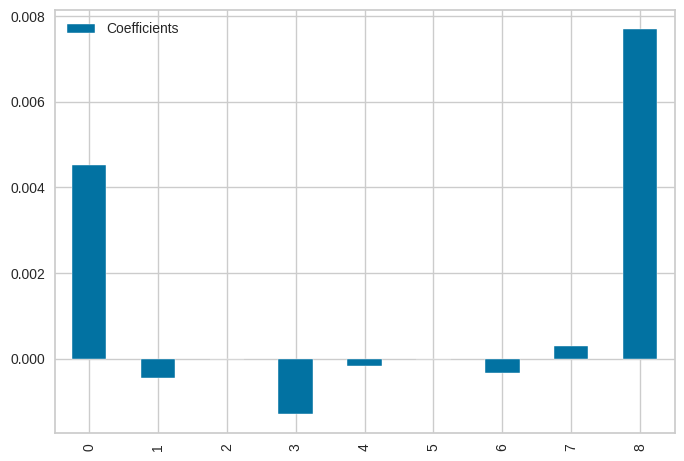

In [41]:
from scipy import stats

df_c = data_norm.copy()
print(df_c.head())
def removeOutliers(data_norm):
  data = data_norm[(np.abs(stats.zscore(data_norm)) < 3).all(axis=1)]
  return data
df1 = removeOutliers(df_c)
from sklearn.model_selection import  train_test_split
df_noOutliers = df1[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability']]
print(len(df_noOutliers))
print(len(df1))




X = df_noOutliers[['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']]

y = df_noOutliers['Potability']

print(len(X))
print(len(y))

#Spliting data into Training set, Validation set and Test set 20%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=1)

  # Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train,y_train)

regr.coef_

print(regr.coef_)
#ax = x_train.plot.bar(y = lregr.coef_)
pad = pd.DataFrame()
pad['ColumnNames'] = X_train.columns.values
pad['Coefficients'] = regr.coef_
pad.plot.bar()
print(pad)

In [42]:
# Make predictions using the training set
y_pred = regr.predict(X_train)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_train, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_train, y_pred))
r2 = r2_score(y_train,y_pred)
print('R^2 score on training set =',r2)

Mean squared error: 0.24
Coefficient of determination: 0.00
R^2 score on training set = 0.0028302041644233666


In [43]:
# Make predictions using the testing set
y_pred = regr.predict(X_test)
# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_test, y_pred))
r2 = r2_score(y_test,y_pred)
print('R^2 score on test set =',r2)

Mean squared error: 0.24
Coefficient of determination: 0.00
R^2 score on test set = 0.0026901325658101882


In [44]:
# Make predictions using the validation set
y_pred = regr.predict(X_val)

# The mean squared error
print('Mean squared error: %.2f'% mean_squared_error(y_val, y_pred))
# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f'% r2_score(y_val, y_pred))
r2_val = r2_score(y_val,y_pred)
print('R^2 score on validation set =',r2_val)

Mean squared error: 0.25
Coefficient of determination: -0.03
R^2 score on validation set = -0.02824432117070441


In the above code we have removed the outliers from the original dataset and made predictions using training, test and validation set, if we compare these values with the dataset with outliers it does not significantly affects the predictive model.

# Model Interpretability

In [45]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [46]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 6.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.3-py2.py3-none-any.whl size=177694727 sha256=4709b9dcd9b6bdd02b928637d9b618b41e4cf945270cb2b3346aae2cd2122be4
  Stored in directory: /root/.cache/pip/wheels/9a/54/b6/c9ab3e71309ef0000bbe39e715020dc151bbfc557784b7f4c9
Successfully built h2o


In [47]:
#loading the libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.impute import KNNImputer
from sklearn import tree
from sklearn import linear_model
from sklearn import ensemble
import statsmodels.api as sd
import sklearn.metrics as sm
from sklearn.model_selection import train_test_split
import random

import warnings
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
warnings.filterwarnings("ignore")

# importing shap
!pip install shap
import shap 

import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 8.9 MB/s eta 0:00:00


In [48]:
data = pd.read_csv("https://raw.githubusercontent.com/Vaishnavi200029/Water_Potability/main/water_potability.csv")

In [49]:
data.shape

(3276, 10)

In [50]:
#taking the basic information of all the columns in the given dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [51]:
#Creating binary vaiables
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
# Create an instance of the OneHotEncoder class
encoder = OneHotEncoder()
# Encode the columns using the fit_transform method
encoded_data = encoder.fit_transform(X_train[['ph']])
# Convert the encoded data to a dataframe
df = pd.DataFrame(encoded_data.toarray(), columns=encoder.get_feature_names_out(['ph']))
# Print the encoded dataframe
print(df)

      ph_2.538115773481364  ph_2.5581027992200664  ph_2.690831240408815  \
0                      0.0                    0.0                   0.0   
1                      0.0                    0.0                   0.0   
2                      0.0                    0.0                   0.0   
3                      0.0                    0.0                   0.0   
4                      0.0                    0.0                   0.0   
...                    ...                    ...                   ...   
1470                   0.0                    0.0                   0.0   
1471                   0.0                    0.0                   0.0   
1472                   0.0                    0.0                   0.0   
1473                   0.0                    0.0                   0.0   
1474                   0.0                    0.0                   0.0   

      ph_2.803563057437167  ph_2.9251743203391  ph_2.974429410478532  \
0                      0.0 

In [52]:
#Defining the Response and the Predictors
y_total=X_train['ph']
df_train=X_train.drop(['ph'],axis=1)

#Storing Numerical and Categorical columns seperately for use later on
num_cols=list(X_train._get_numeric_data().columns)
cat_cols=list(set(X_train.columns)-set(num_cols))
df_train.head()

,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
2158,217.771631,23575.991430,7.493024,279.146683,548.155383,10.329558,65.180543,3.137280
2664,189.447965,32358.538595,6.346378,341.346443,490.625291,12.537466,61.581378,2.642004
1664,214.071982,14619.627261,6.584414,315.996793,370.795604,12.219411,83.668879,3.788803
1493,148.624606,23688.205223,7.003488,339.112673,259.963763,17.218575,56.044934,4.015246
1067,216.665319,23027.385262,9.796330,382.152977,369.468072,18.967259,59.651523,4.398901


In [53]:
#Encoding the categorical variables
mapping_dict={}
for col in cat_cols:
    mapping_dict[col]={k: i for i, k in enumerate(df_train[col].unique())}
    df_train[col] = df_train[col].map(mapping_dict[col])

# Normalizaing the Data

In [54]:
# Normalizing our data for proper analysis

# list of numerical columns which require normalization
num_cols=[ 'Hardness', 'Solids', 'Chloramines',
       'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']

# Importing required library from sklearn for normalization
from sklearn import preprocessing
feature_to_scale = num_cols

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
df_train[feature_to_scale] = min_max_scaler.fit_transform(X_train[feature_to_scale])

df_train.head()

,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
2158,0.634286,0.492066,0.557127,0.273567,0.745124,0.301416,0.484096,0.314823
2664,0.483720,0.677900,0.431745,0.536619,0.621423,0.414928,0.446224,0.207786
1664,0.614619,0.302553,0.457773,0.429412,0.363764,0.398576,0.678642,0.455628
1493,0.266707,0.494440,0.503598,0.527172,0.125452,0.655592,0.387966,0.504567
1067,0.628405,0.480457,0.808986,0.709197,0.360909,0.745495,0.425917,0.587481


In [55]:
# Checking for any null values in the dataset, as we hav no null values - we are good to go.
df_train.isnull().sum()  

Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
dtype: int64

In [56]:
df_train.describe()  # Statistical description of our dataset

,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
count,1475.000000,1475.000000,1475.000000,1475.000000,1475.000000,1475.000000,1475.000000,1475.000000
mean,0.515591,0.452116,0.514970,0.505056,0.481983,0.508358,0.496793,0.495940
std,0.167838,0.174621,0.170934,0.165786,0.172306,0.168427,0.166356,0.164283
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.411662,0.326351,0.407477,0.398501,0.350569,0.395961,0.388382,0.382134
50%,0.518566,0.428899,0.516104,0.501583,0.476452,0.506912,0.496680,0.495863
75%,0.622149,0.564037,0.628372,0.610374,0.602036,0.627455,0.612155,0.614114
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### *Calculating VIF*

In [57]:
def calculate_vif(X):
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif

In [58]:
vif_df = calculate_vif(df_train)

In [59]:
print(vif_df)

         variables       VIF
0         Hardness  8.675406
1           Solids  6.673498
2      Chloramines  8.582888
3          Sulfate  8.619537
4     Conductivity  7.820584
5   Organic_carbon  9.150494
6  Trihalomethanes  8.625914
7        Turbidity  9.006882


## OLS Model

In [82]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(data1['Potability'], data1[['ph', 'Hardness', 'Solids', 'Chloramines',
       'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:             Potability   R-squared (uncentered):                   0.391
Model:                            OLS   Adj. R-squared (uncentered):              0.389
Method:                 Least Squares   F-statistic:                              232.8
Date:                Mon, 10 Apr 2023   Prob (F-statistic):                        0.00
Time:                        01:19:52   Log-Likelihood:                         -2294.9
No. Observations:                3276   AIC:                                      4608.
Df Residuals:                    3267   BIC:                                      4663.
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
ph                  0.0053      0.003      1.841      0.066      -0.000       0.011
Hardness            0.0002      0.000      1.117      0.264      -0.000       0.001
Solids           2.859e-06   9.48e-07      3.016      0.003       1e-06    4.72e-06
Chloramines         0.0146      0.005      2.950      0.003       0.005       0.024
Sulfate            7.4e-05   5.75e-05      1.288      0.198   -3.87e-05       0.000
Conductivity     8.857e-05    9.6e-05      0.923      0.356   -9.97e-05       0.000
Organic_carbon     -0.0018      0.002     -0.726      0.468      -0.007       0.003
Trihalomethanes     0.0008      0.000      2.034      0.042    2.84e-05       0.002
Turbidity           0.0147      0.010      1.482      0.139      -0.005       0.034
==============================================================================
Omnibus:                    13725.508   Durbin-Watson:                   0.036
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              535.153
Skew:                           0.447   Prob(JB):                    6.21e-117
Kurtosis:                       1.233   Cond. No.                     2.78e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 2.78e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

The fact that the F-Statistic value is not equal to zero, as seen from the information supplied above, suggests that there is a correlation between the X and Y values.

Additionally, we may examine the T-Statistic values and determine which parameters significantly affect the result in a favorable or negative way. We can use SHAP analysis to investigate this further.


Next, we will use a straightforward linear regression model and perform SHAP analysis on it.

Text(0.5, 1.0, 'Variable Correlation')

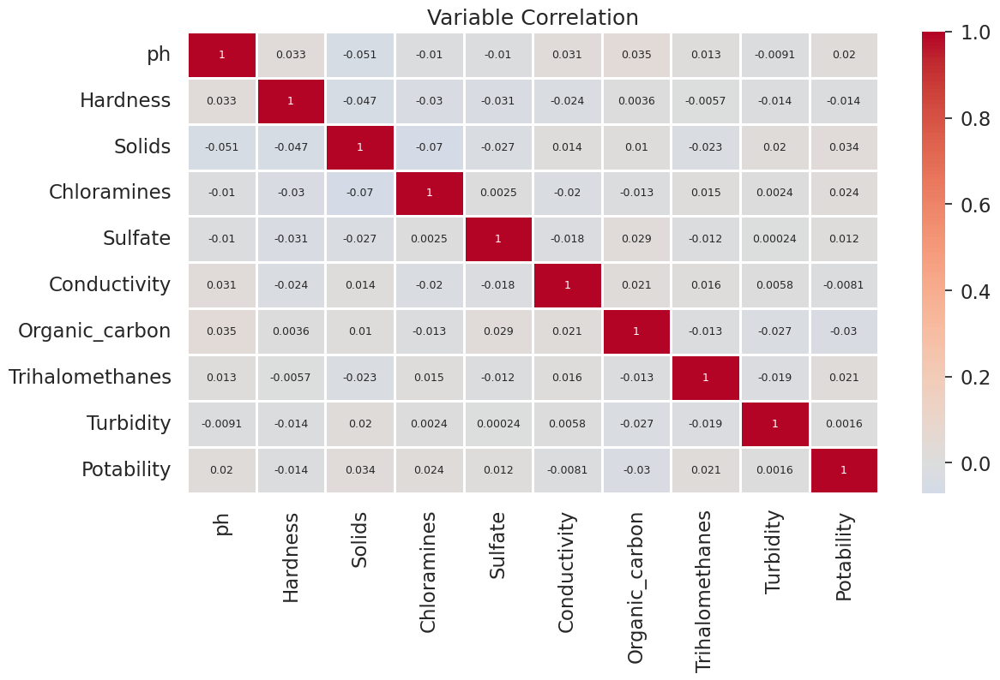

In [83]:
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(13,7))

sns.heatmap(data1.corr(),center=0, linewidths=0.9,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

## Performing Linear Regression

In [88]:
data.isna().head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False


In [89]:
nanValues = data.isna()
nanColumns = nanValues.any()
columnsWithNan = data.columns[nanColumns].tolist()
print(columnsWithNan)

[]


In [90]:
data.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [91]:
from pandas.core.series import FillnaOptions
FillnaOptions = data.fillna(0)

In [92]:
data1 = data.fillna(0)
data.fillna(0,inplace=True)
data1 = data.replace(np.nan, 0)
data1.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.000000,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,0.000000,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,0.000000,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [93]:
#Computing Linear Regression model for Water Potability dataset
def linear_reg(X_train,y_train,X_test,y_test):
    linear_reg = LinearRegression()
    linear_reg_model = linear_reg.fit(X_train,y_train)
    print('Train set')
    pred=linear_reg_model.predict(X_train)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_train,pred)))
    print('Test set')
    pred=linear_reg_model.predict(X_test)
    model_lr=linear_reg_model.predict(X_test)
    print('Linear Regression Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('Linear Regression r2_score :{}'.format(r2_score(y_test,pred))) 

In [94]:
from sklearn.model_selection import  train_test_split

X = data1[ ['ph', 'Hardness', 'Solids', 'Chloramines',
       'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']]

y = data1['Potability']

#Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=1)

In [95]:
from sklearn import linear_model

model = linear_model.LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [96]:
cols1= ['ph', 'Hardness', 'Solids', 'Chloramines',
       'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']

In [97]:
#Computing R2 for testing and training data
linear_reg(X_train[cols1],y_train,X_test[cols1],y_test)

Train set
Linear Regression Mean Squared error :0.2354938372616404
Linear Regression r2_score :0.004470786744829258
Test set
Linear Regression Mean Squared error :0.24785036376330694
Linear Regression r2_score :-0.011291900296265034


## SHAP Analysis on Linear Regression model
The SHAP values for each feature show how the expected model prediction changes when that characteristic is taken into consideration. The SHAP value for each feature describes how that feature contributes to explaining the discrepancy between the average model prediction and the instance's actual prediction.The core of the Shapley value is to measure each coalition member's individual input to the final result while maintaining that the sum of those contributions equals the result.The input feature addition to each prediction can be measured using SHAP values in model explanation.

In [85]:
%%capture
!pip install shap
import shap 

In [98]:
import shap
shap.initjs()

In [99]:
#Initializing explainer from shap, lm is our trained model
explainer_shap=shap.LinearExplainer(model=model, masker=X_train)

#Computing shap values for train dataset
shap_values = explainer_shap.shap_values(X_train)

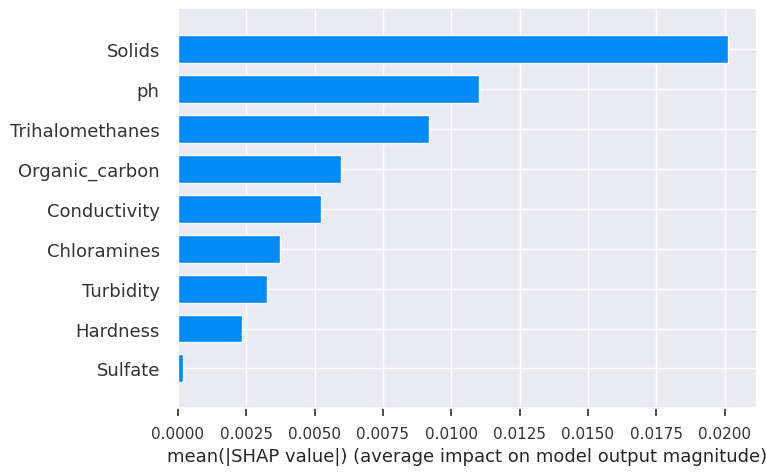

In [75]:
shap.summary_plot(shap_values, X, plot_type="bar")

In [100]:
# Giving input as 1% of whole dataset as SHAP cant handle large dataset
X = X_train.sample(frac=0.01,random_state=200)
#LinearExplainer is used as linear regression model is used
explainer = shap.LinearExplainer(model, X, feature_perturbation="interventional") 
shap_values = explainer.shap_values(X) #Saving SHAP values

In [77]:
#Initialize java script
shap.initjs()

 #Explain one row in the data with the
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [101]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)  

In [103]:
#Initializing explainer from shap, lm is our trained model
explainer_shap=shap.LinearExplainer(model=model, masker=X_train)

#Computing shap values for train dataset
shap_values = explainer_shap.shap_values(X_train)

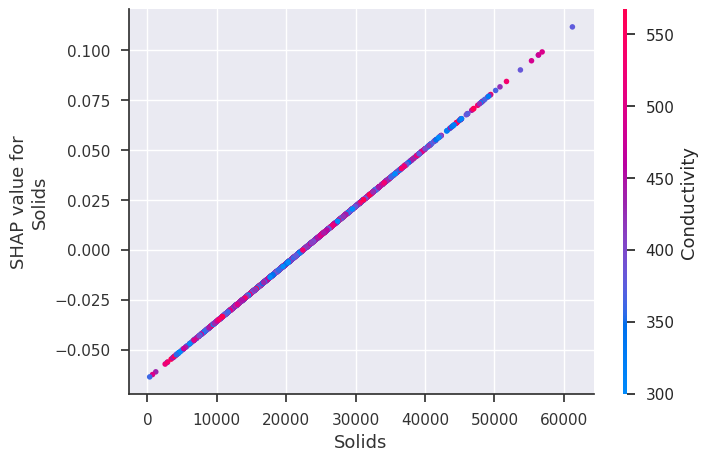

In [104]:
shap.dependence_plot("Solids", shap_values, X_train)

In [105]:
from sklearn.linear_model import LinearRegression
import shap

# train Linear model
#Seperating the dependent and independent variable from the main dataset
X=data.drop(['Potability'],axis=1)
y=data['Potability']
regressor = LinearRegression()
linear_reg = regressor.fit(X, y)

# compute SHAP values
explainer = shap.Explainer(linear_reg, X)
shap_values = explainer(X)

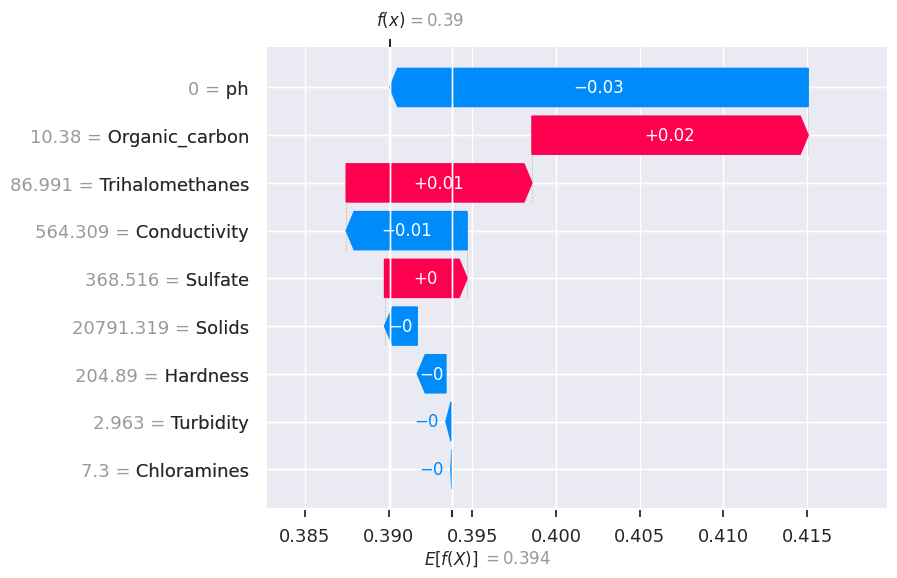

In [106]:
shap.plots.waterfall(shap_values[0])

For the linear regression model from the plots it can be interpreted that ph, organic carbon and trihalomethanes are the important features for this regressor model. These are the major features in determining the Potability of the water.

# Performing Random Forest

In [107]:
def ramdomforest(X_train,y_train,X_test,y_test):
    rf = RandomForestRegressor()
    rf_model = rf.fit(X_train,y_train)
    print('Train set')
    pred=rf_model.predict(X_train)
    print('ramdomforest Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('ramdomforest r2_score :{}'.format(r2_score(y_train,pred)))
    print('Tesst set')
    pred=rf_model.predict(X_test)
    print('ramdomforest Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('ramdomforest r2_score :{}'.format(r2_score(y_test,pred)))

random_forest = RandomForestRegressor(n_estimators=100)
random_forest.fit(X_train, y_train) 

RandomForestRegressor()

In [108]:
ramdomforest(X_train[cols1],y_train,X_test[cols1],y_test)

Train set
ramdomforest Mean Squared error :0.030939520958083833
ramdomforest r2_score :0.8692059320275458
Tesst set
ramdomforest Mean Squared error :0.2124518292682927
ramdomforest r2_score :0.13314303485417356


## SHAP Analysis on Random Forest Model

In [109]:
%%capture
!pip install shap
import shap 

In [110]:
# Giving input as 1% of whole dataset as SHAP cant handle large dataset
X = X_train.head(10)
 # Using Tree explainer as this is tree based classifier model
explainer = shap.TreeExplainer(random_forest)
#Saving shap values
shap_values = explainer.shap_values(X) 

In [111]:
shap.initjs() #Initialize java script
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:]) #Explain one row in the data with the model

In [112]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X) 

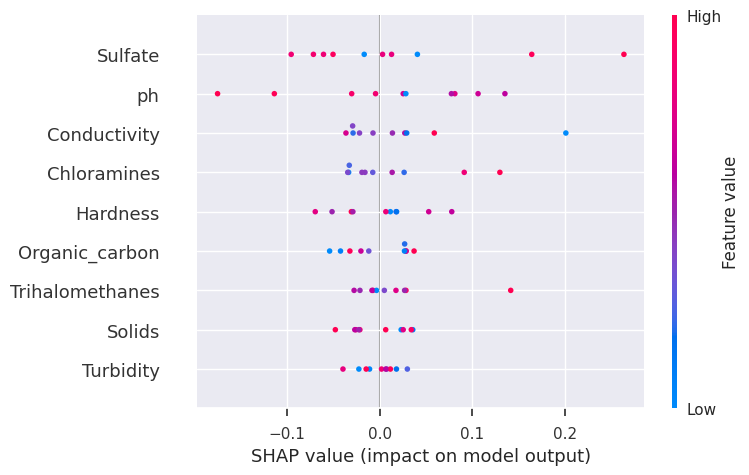

In [113]:
shap.initjs()
shap.summary_plot(shap_values, X) 

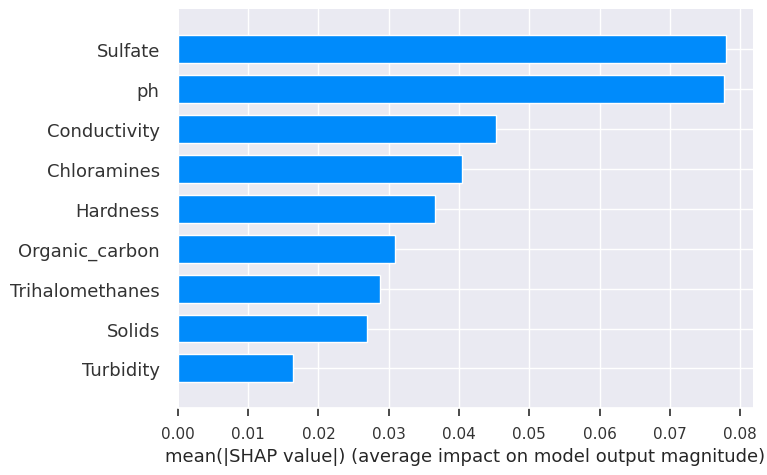

In [114]:
shap.summary_plot(shap_values, X, plot_type="bar")

In [115]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import load_iris
iris = load_iris()

model_rf1 = RandomForestRegressor(n_estimators=10)
# Train
model_rf1.fit(iris.data, iris.target)
# Extract single tree
estimator = model_rf1.estimators_[5]

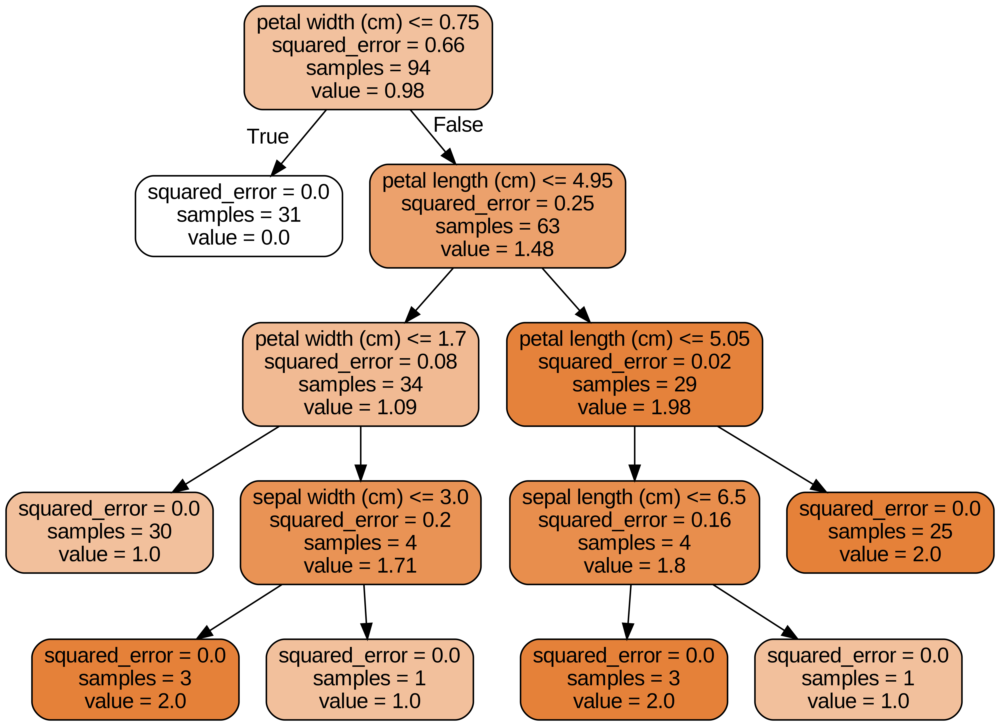

In [116]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = iris.feature_names,
                class_names = iris.target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in colab notebook
from IPython.display import Image
Image(filename = 'tree.png')

For the random forest model according to SHAP Analysis the important features to determine the target variable 'Potability' are ph, sulfate and chloramines. ph is the common feature which is important for both Random Forest and Linear Regression Model. ph has the highest value of feature importance and is placed first on the scale.

## Using AutoML to identify best model

In [117]:
#importing all the necessary libraries

import h2o
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import numpy as np
import scipy

In [118]:
# Set a minimum memory size and a run time in seconds
min_mem_size=6 
run_time=222

In [119]:
# Use 50% of availible resources
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

5


In [120]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:25218..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpvtkqytth
  JVM stdout: /tmp/tmpvtkqytth/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpvtkqytth/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:25218
Connecting to H2O server at http://127.0.0.1:25218 ... successful.


H2O_cluster_uptime:,04 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_ooyupz
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [121]:
# Create a 80/20 train/test split
url = "https://raw.githubusercontent.com/Vaishnavi200029/Water_Potability/main/water_potability.csv"
df = h2o.import_file(path = url)
pct_rows=0.80
df_train, df_test = df.split_frame([pct_rows])

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [122]:
# Set the features and target
X=df.columns
print(X)

y ='Potability'
X.remove(y) 
print(X)

['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability']
['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']


In [123]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)
# Passing the training and testing dataset through H20 AutomML
aml.train(x=X,y=y,training_frame=df_train) 

AutoML progress: |
01:27:47.29: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
01:27:53.827: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
01:27:56.74: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
01:28:01.330: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
01:28:01.795: _response param, We have det

key,value
Stacking strategy,cross_validation
Number of base models (used / total),5/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),2/2
# DeepLearning base models (used / total),1/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [124]:
print(aml.leaderboard)

model_id                                                    rmse       mse       mae     rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_12746  0.455463  0.207446  0.414687  0.320542                  0.207446
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_12746  0.455678  0.207643  0.414503  0.320696                  0.207643
StackedEnsemble_AllModels_3_AutoML_1_20230410_12746     0.456172  0.208092  0.413864  0.320934                  0.208092
StackedEnsemble_AllModels_2_AutoML_1_20230410_12746     0.456421  0.20832   0.415113  0.321122                  0.20832
StackedEnsemble_AllModels_1_AutoML_1_20230410_12746     0.460362  0.211933  0.422941  0.324004                  0.211933
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_12746  0.460767  0.212306  0.424037  0.324356                  0.212306
GBM_grid_1_AutoML_1_20230410_12746_model_5              0.462607  0.214005  0.419388  0.325998                  0.214005
GBM_grid_1_AutoML_1_20230410_1274

In [125]:
model_index=0
glm_index=0
glm_model=''
aml_leaderboard_df=aml.leaderboard.as_data_frame()
models_dict={}
for m in aml_leaderboard_df['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break 
  model_index=model_index+1  

for m in aml_leaderboard_df['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break  
  glm_index=glm_index+1     
models_dict

{'StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_12746': 0,
 'StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_12746': 1,
 'StackedEnsemble_AllModels_3_AutoML_1_20230410_12746': 2,
 'StackedEnsemble_AllModels_2_AutoML_1_20230410_12746': 3,
 'StackedEnsemble_AllModels_1_AutoML_1_20230410_12746': 4,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_12746': 5,
 'GBM_grid_1_AutoML_1_20230410_12746_model_5': 6,
 'GLM_1_AutoML_1_20230410_12746': 54}

In [126]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index,'model_id'])

6


In [127]:
#Printing the best model
print("The best model is - " , best_model.algo)

The best model is -  gbm


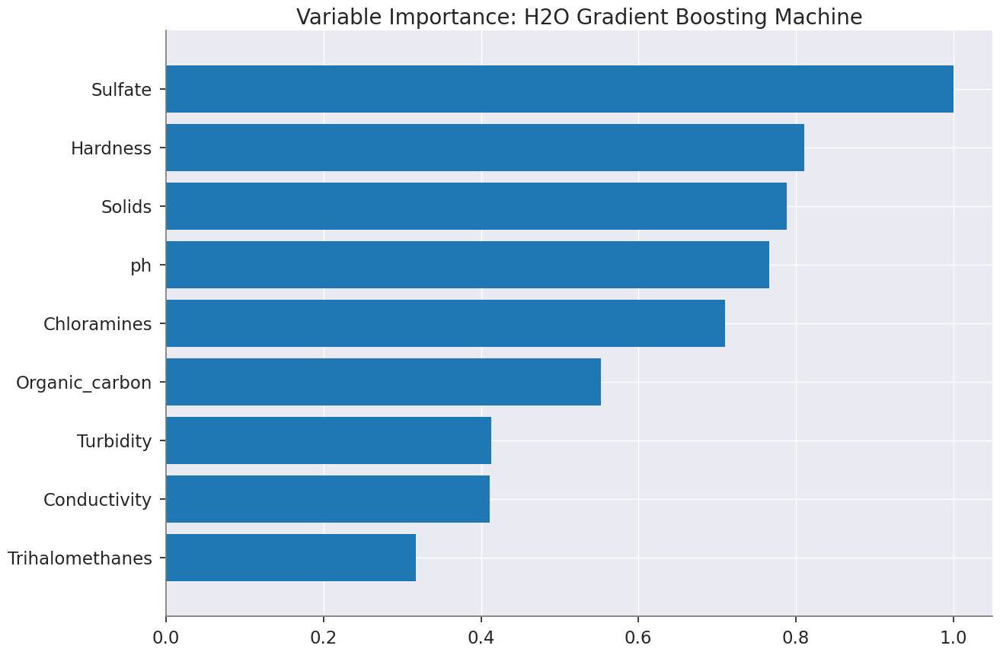

<Figure size 800x550 with 0 Axes>

In [128]:
#plot variables in order of their importance for price prediction
if best_model.algo in ['gbm','drf','xrt','xgboost']:
    best_model.varimp_plot()

54
glm


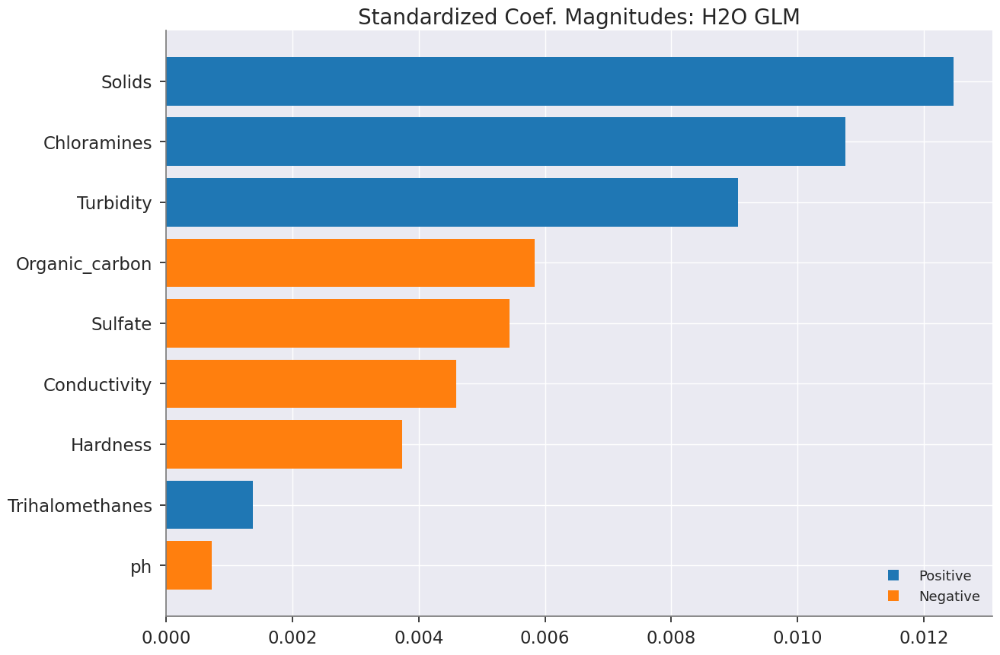

In [129]:
if glm_index is not 0:
  print(glm_index)
  glm_model=h2o.get_model(aml.leaderboard[glm_index,'model_id'])
  print(glm_model.algo) 
  glm_model.std_coef_plot()

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_3_AutoML_1_20230410_12746,0.464375,0.215644,0.430425,0.326892,0.215644,1032,0.179741,StackedEnsemble
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_12746,0.464609,0.215862,0.430796,0.327182,0.215862,433,0.146401,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20230410_12746,0.46501,0.216234,0.431391,0.327507,0.216234,472,0.116641,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_12746,0.465209,0.216419,0.431704,0.327813,0.216419,394,0.200691,StackedEnsemble
DeepLearning_1_AutoML_1_20230410_12746,0.471127,0.221961,0.439414,0.333895,0.221961,349,0.007901,DeepLearning
XRT_1_AutoML_1_20230410_12746,0.471573,0.222381,0.429647,0.329335,0.222381,974,0.023629,DRF
StackedEnsemble_AllModels_1_AutoML_1_20230410_12746,0.471638,0.222442,0.434353,0.328068,0.222442,464,0.101573,StackedEnsemble
DRF_1_AutoML_1_20230410_12746,0.472506,0.223262,0.435827,0.329591,0.223262,1658,0.043323,DRF
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_12746,0.472797,0.223537,0.435657,0.329027,0.223537,364,0.064775,StackedEnsemble
GBM_grid_1_AutoML_1_20230410_12746_model_12,0.473064,0.22379,0.440949,0.32951,0.22379,224,0.020059,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

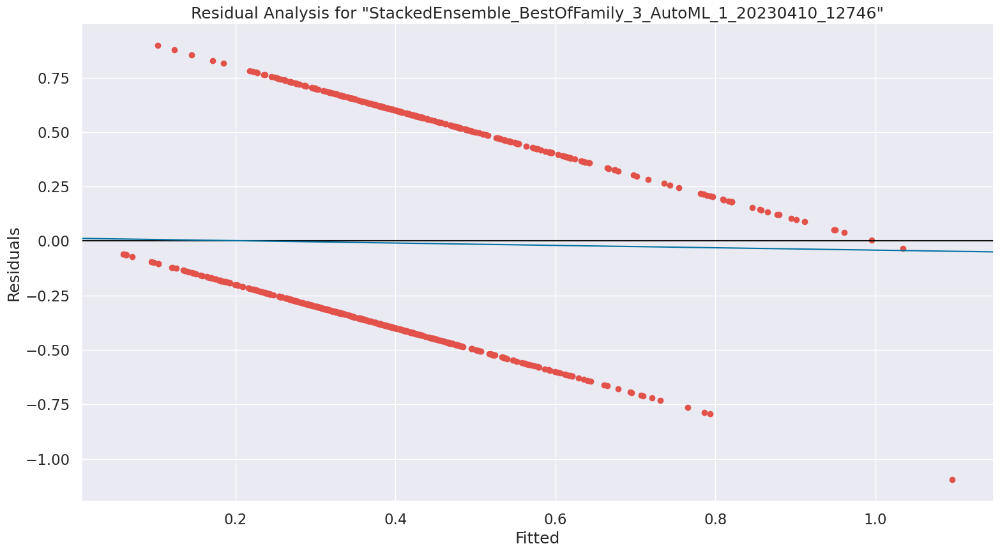

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

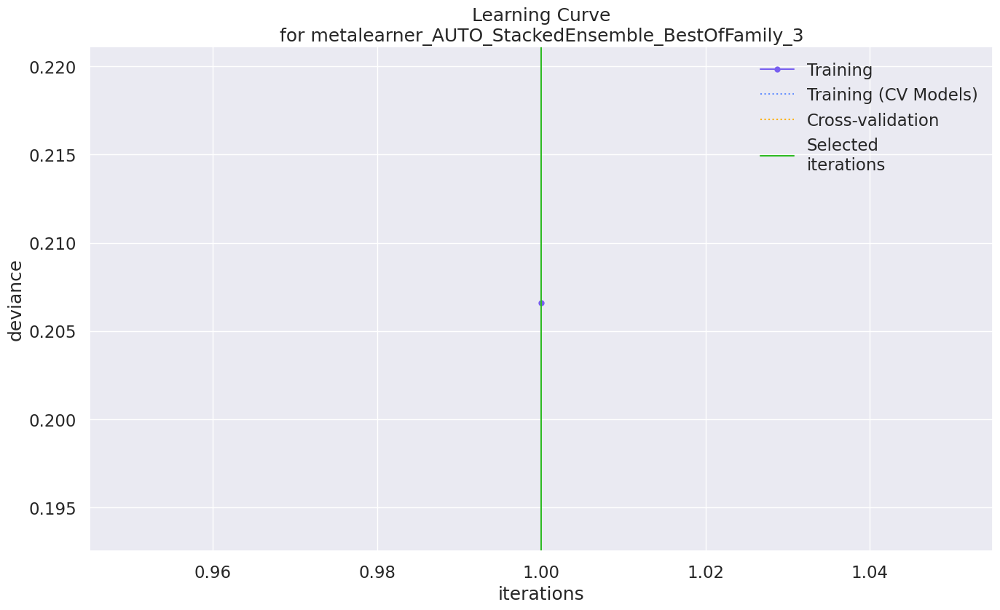

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

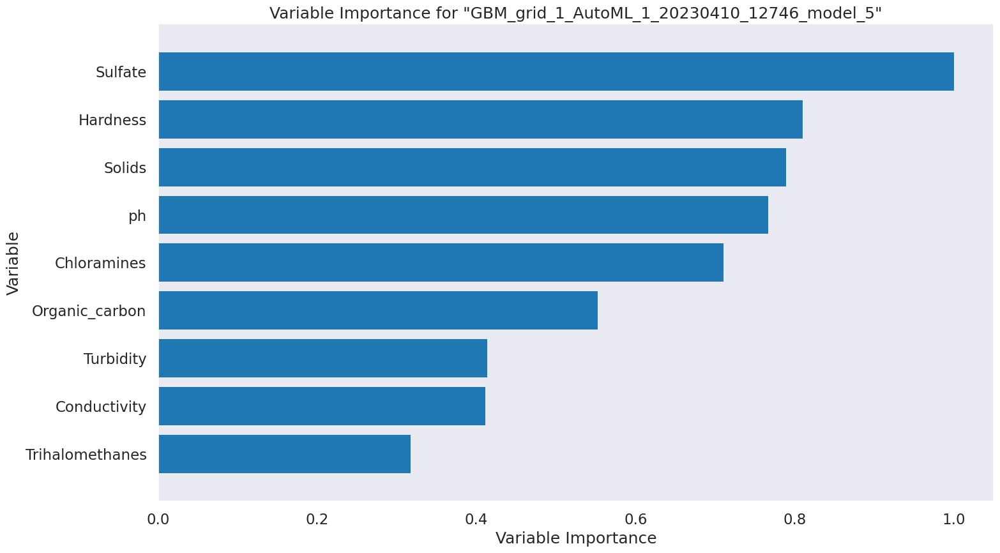

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

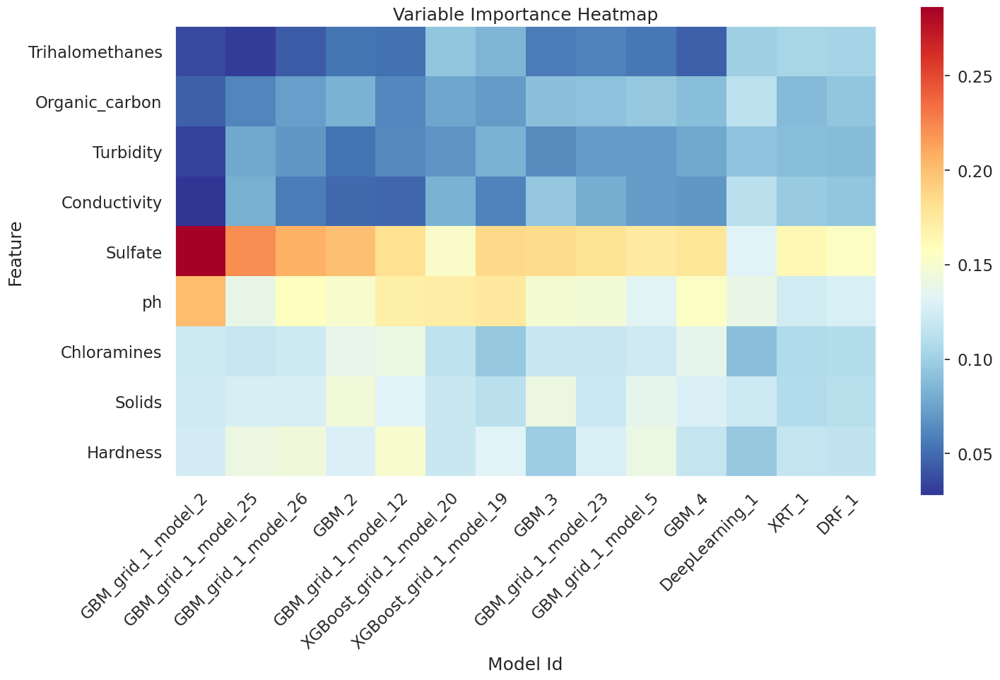

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

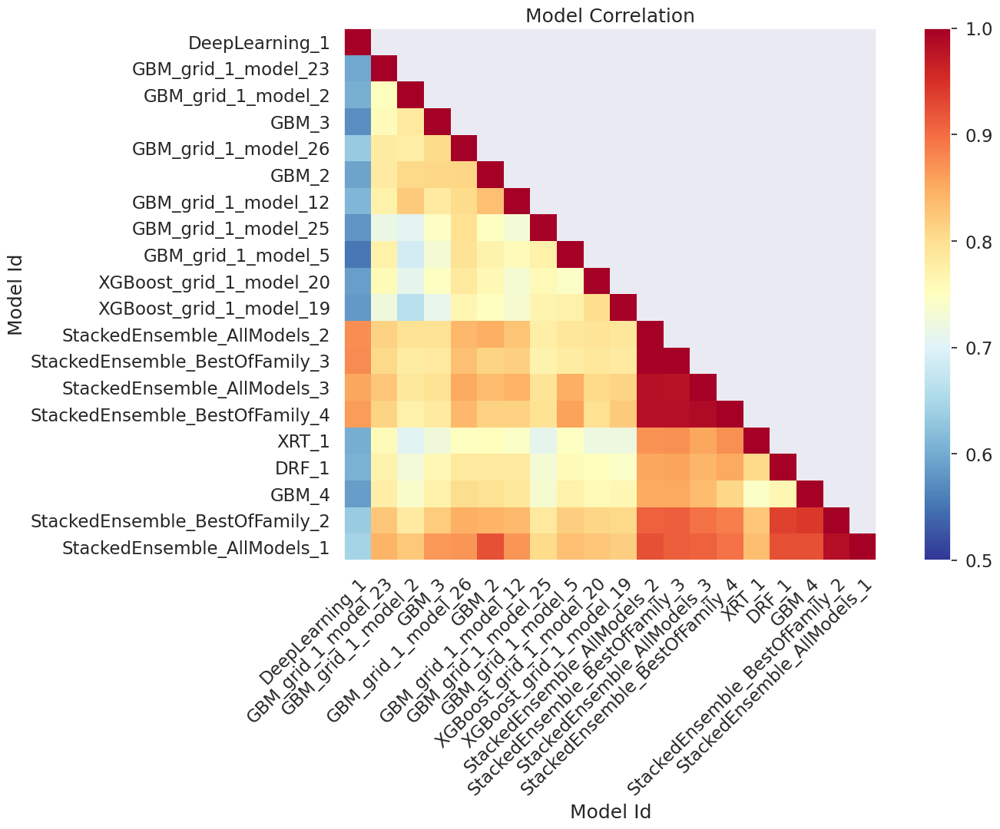

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

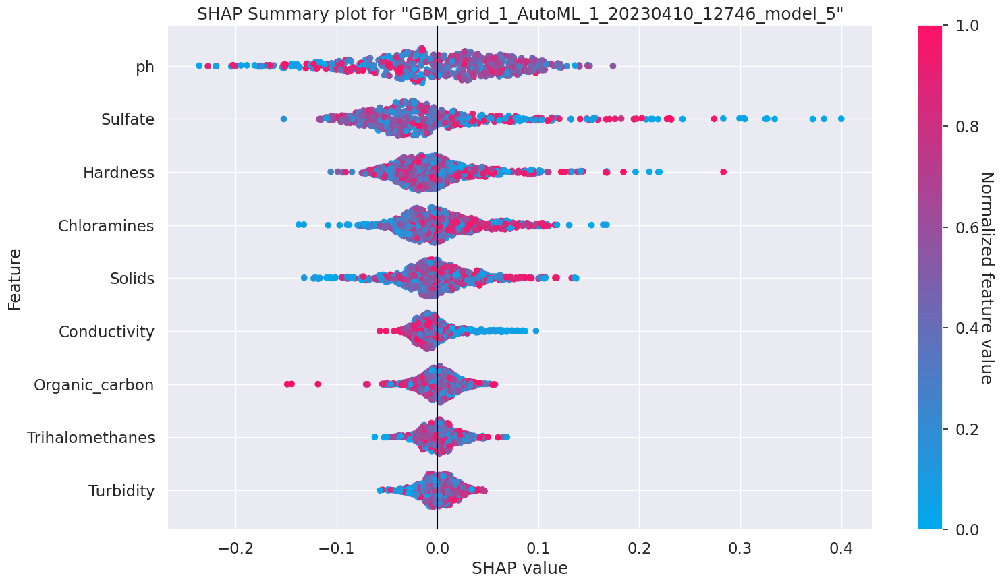

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

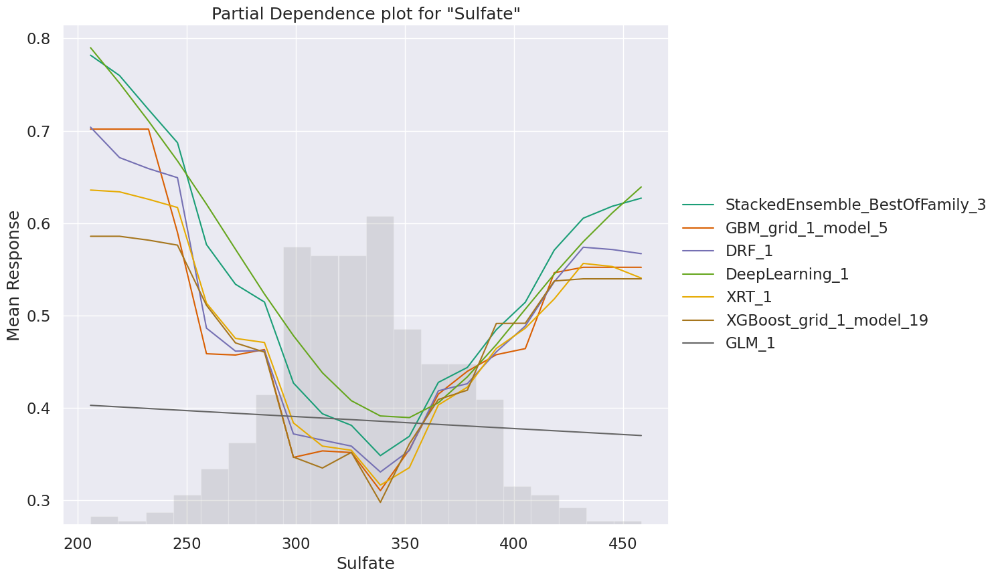

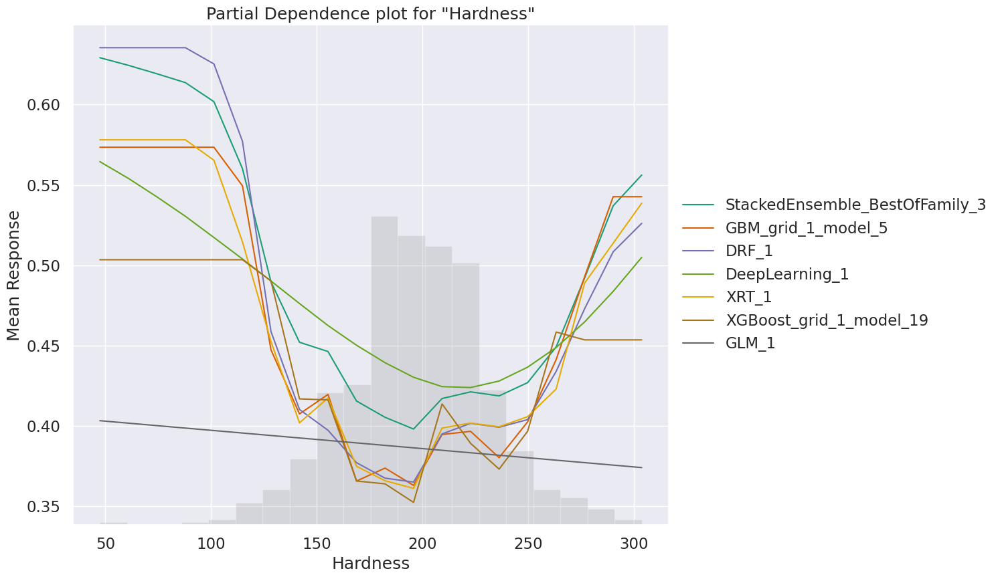

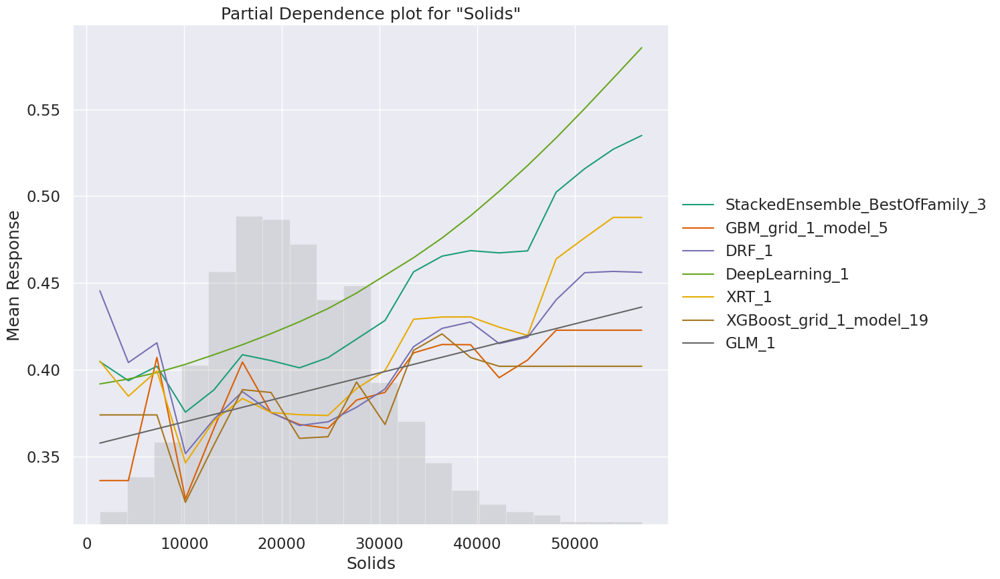

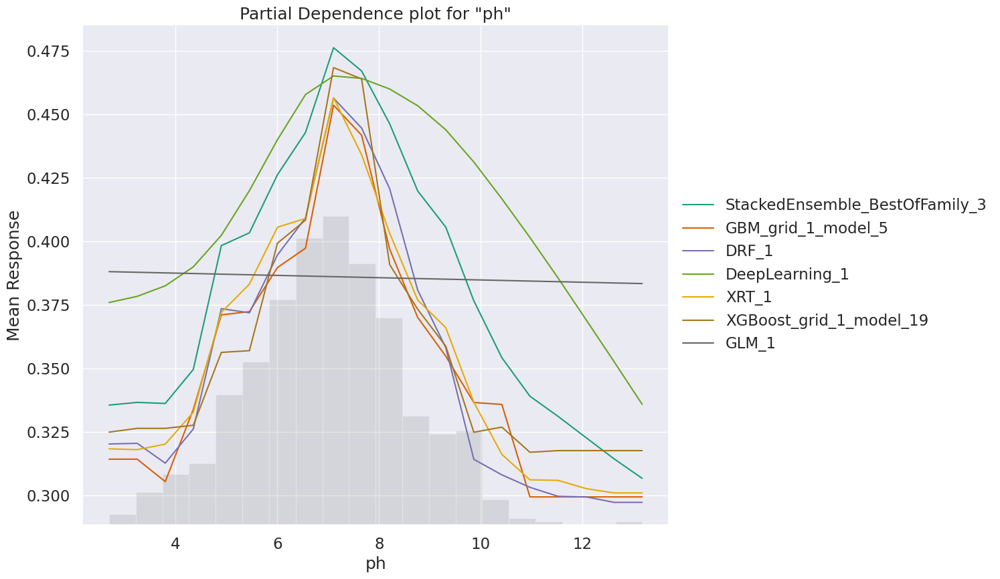

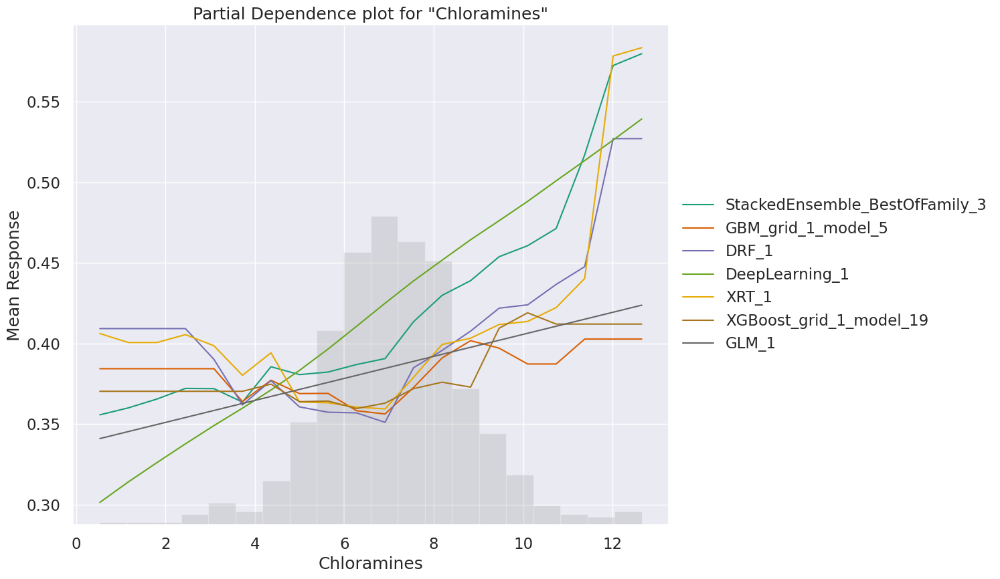

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

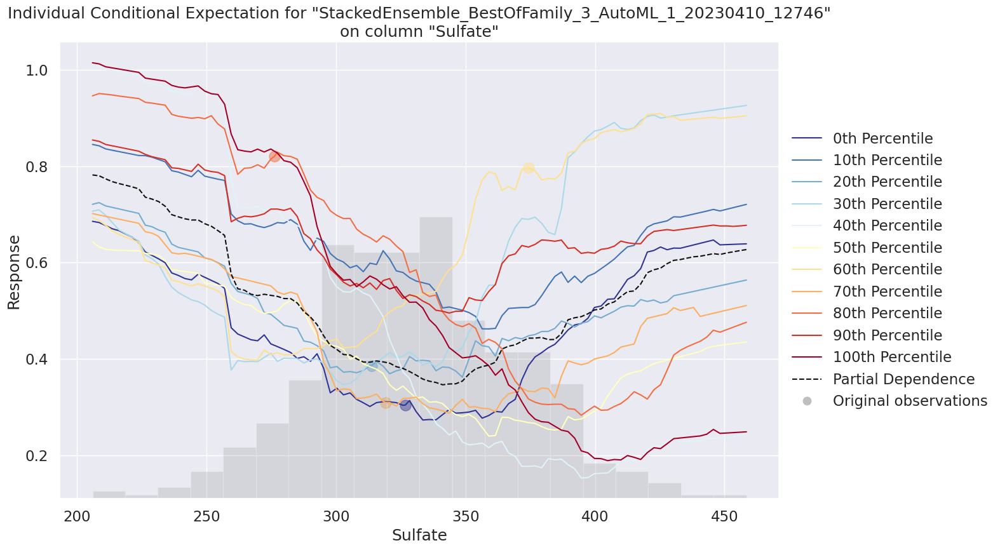

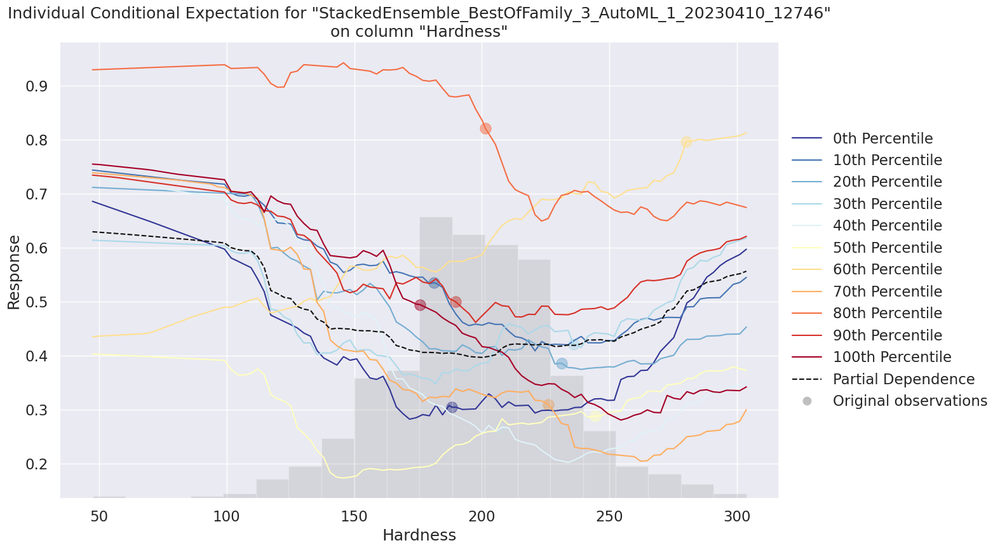

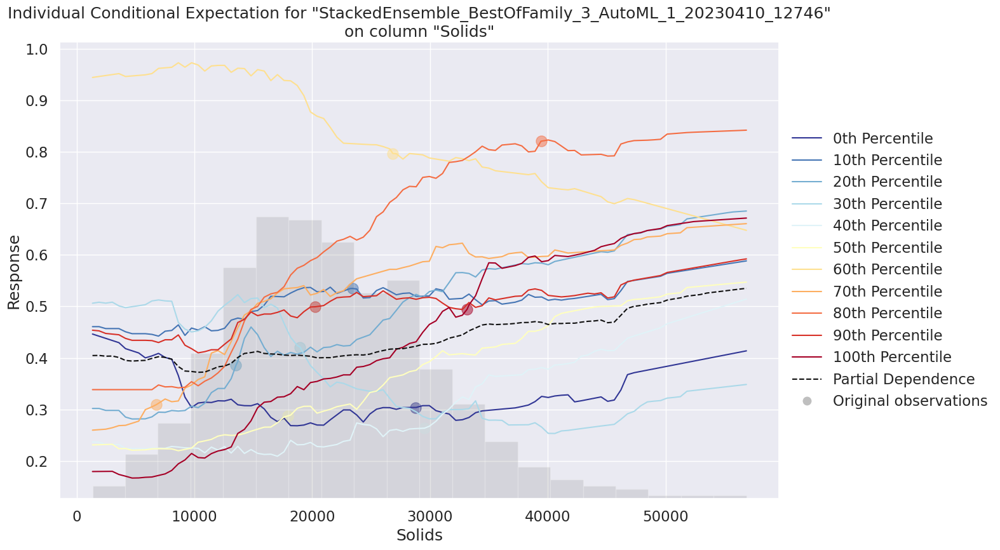

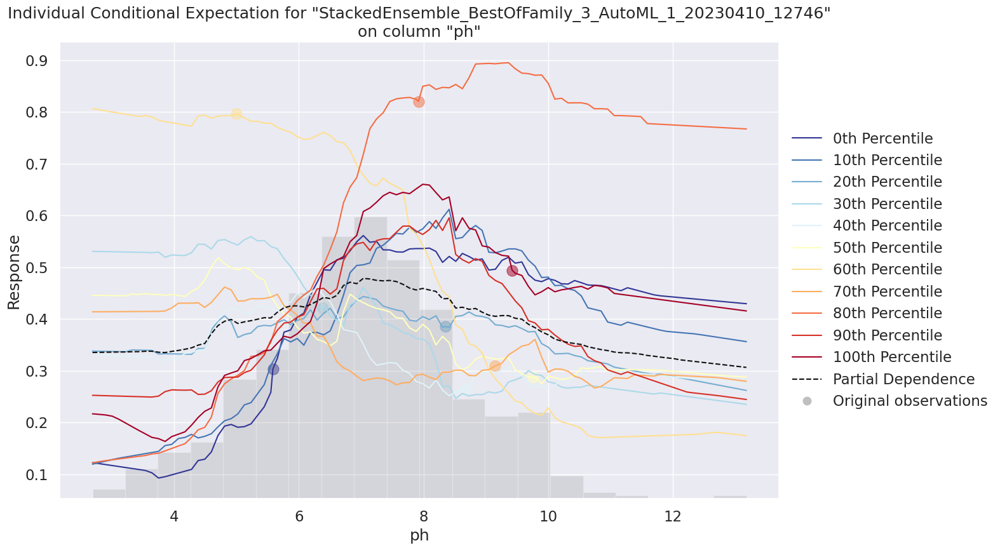

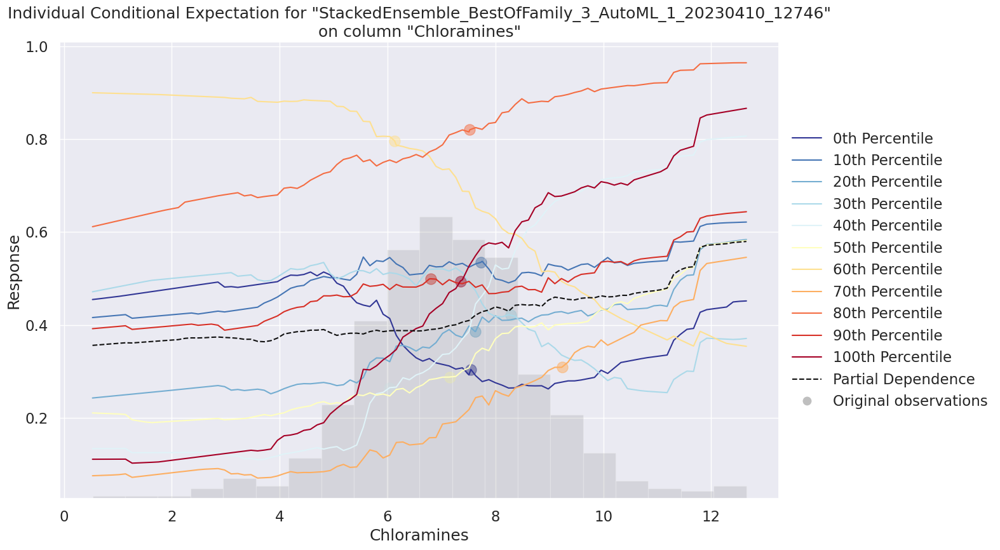

In [130]:
exa = aml.explain(df_test)

In [136]:
import h2o
from h2o.estimators.glm import H2OGeneralizedLinearEstimator


In [137]:
# Initialize an H2O cluster
h2o.init()

# Load data into an H2OFrame object
df = h2o.import_file("https://raw.githubusercontent.com/Vaishnavi200029/Water_Potability/main/water_potability.csv")

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpjffeyynb
  JVM stdout: /tmp/tmpjffeyynb/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpjffeyynb/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,04 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_je9pfv
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
H2O session _sid_8035 closed.


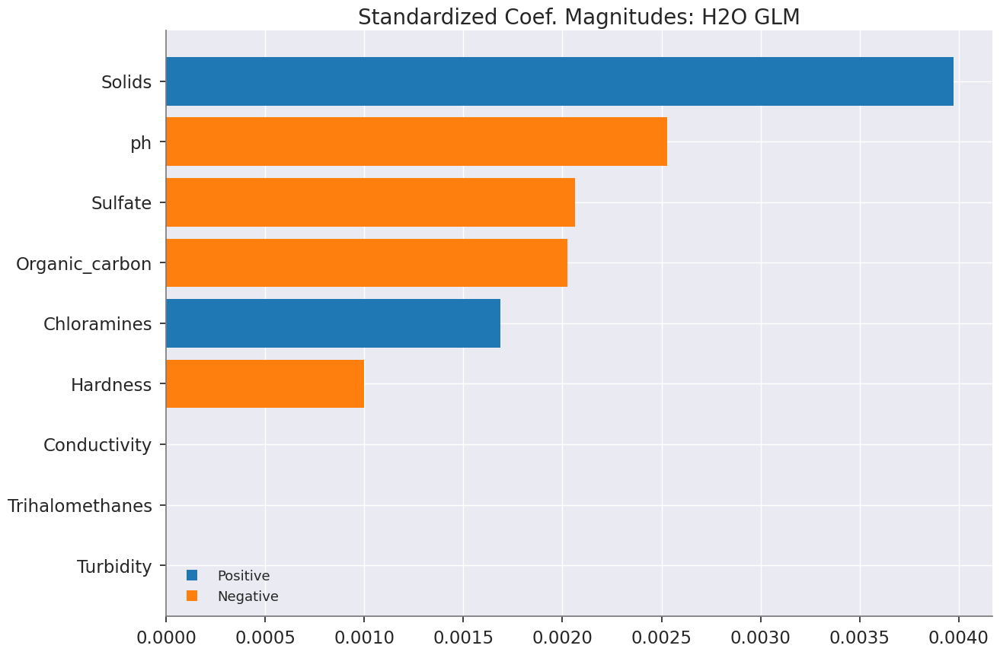

In [138]:
# Define the Lasso regularization model
lasso = H2OGeneralizedLinearEstimator(alpha=1, lambda_=0.01, family='gaussian', seed=1)

# Specify the predictors and response variables
predictors = df.columns[:-1]
response = 'Potability'

# Split the data into training and validation sets
train, valid = df.split_frame(ratios=[0.8])

# Train the model using the training set
lasso.train(x=predictors, y=response, training_frame=train)

# Plot the standardized coefficients of the model against the predictor variables
lasso.std_coef_plot()

# Shut down the H2O cluster
h2o.shutdown()

In [140]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

# Define the Lasso regularization model
lasso = H2OGeneralizedLinearEstimator(alpha=1, # L1 regularization
                                      lambda_=0.01, # Regularization strength
                                      family='gaussian',
                                      interaction_pairs=None,
                                      lambda_search=False,
                                      seed=1)
predictors = df.columns[:-1]
response = 'Potability'
# Train the model using the training set


# Plot the standardized coefficients of the model against the predictor variables
#lasso.std_coef_plot()


## Lasso Regularization

In [144]:
import h2o
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

h2o.init()

# Convert X_train to an H2OFrame
train_h2o = h2o.H2OFrame(X_train)

# Define the Lasso regularization model
lasso = H2OGeneralizedLinearEstimator(alpha=1, # L1 regularization
                                      lambda_=0.01, # Regularization strength
                                      family='gaussian',
                                      interaction_pairs=None,
                                      lambda_search=False,
                                      seed=1)
predictors = train_h2o.columns[:-1]
response = 'ph'
# Train the model using the training set
lasso.train(x=predictors, y=response, training_frame=train_h2o)
# Plot the standardized coefficients of the model against the predictor variables
#lasso.std_coef_plot()

# Print model details
print(lasso) 

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,23 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_wewtqr
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681091092666_1


GLM Model: summary
    family    link      regularization          number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ----------------------  ----------------------------  -----------------------------  ----------------------  ------------------------------------------------------
    gaussian  identity  Lasso (lambda = 0.01 )  7                             7                              1                       Key_Frame__upload_8b5c3bd84bf56a9514beeb05e0314fa9.hex

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 8.48802515049904
RMSE: 2.913421553860519
MAE: 2.184965093568211
RMSLE: 0.785017

## Ridge Regularization

In [148]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

# Define the Ridge regularization model
ridge = H2OGeneralizedLinearEstimator(alpha=0, # L2 regularization
                                      lambda_=0.01, # Regularization strength
                                      family='gaussian',
                                      interaction_pairs=None,
                                      lambda_search=False,
                                      seed=1)
predictors = df.columns[:-1]
response = 'ph'

# Train the model using the training set
ridge.train(x=predictors, y=response, training_frame=train_h2o)

# Print the model details
print(ridge)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681091092666_4


GLM Model: summary
    family    link      regularization           number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  -----------------------  ----------------------------  -----------------------------  ----------------------  ------------------------------------------------------
    gaussian  identity  Ridge ( lambda = 0.01 )  8                             8                              1                       Key_Frame__upload_8b5c3bd84bf56a9514beeb05e0314fa9.hex

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 8.477075825006965
RMSE: 2.911541829513525
MAE: 2.182182234350943
RMSLE: 0.7847764563097436
Mean Residual Deviance: 8.477075825006965
R^2: 0.006616850675202568
Null degrees

# Questions

# **What is the Question?**

This assignment involves the analysis of the water potability dataset for predictive learning purposes. The dataset contains data on water samples collected from various sources to determine if the water is safe to drink. The data is examined for quality, consistency, completeness, and the key features that are important for predicting water potability are identified. Several questions are answered in the analysis, including the data types, missing values, likely distributions of numeric variables, important independent variables for predicting the target variable, and the impact of removing outliers and missing data. The objective is to build a classifier model, a regression model, and an H20 AutoML model to find the optimal model for the dataset. SHAP analysis is performed on all models to interpret the results. The linear regression and random forest classifier models are found to be useful in predicting and analyzing water potability to some extent, although there is room for improvement using more advanced machine learning techniques. Overall, the findings from this analysis can be used to develop models that predict water potability and provide insights into the factors that influence water quality.


# **What did we do?**

Data cleaning is the process of identifying and correcting or removing errors, inconsistencies, and discrepancies in a dataset. This process is essential in ensuring that the dataset is accurate and suitable for analysis. One common task in data cleaning is handling missing values. Missing values can arise due to various reasons such as data entry errors or data loss during collection. To handle missing values, techniques such as mean imputation, median imputation, or k-nearest neighbor imputation can be used.

Another task in data cleaning is removing duplicates. Duplicate rows or columns can arise due to errors in data entry or data collection. Removing duplicates ensures that the dataset is not biased and does not contain redundant information.
In addition, data cleaning also involves correcting errors in the dataset. These errors can be identified by manually checking the data or using outlier detection techniques. Outliers are data points that deviate significantly from the rest of the data and can skew the results of any analysis. By identifying and correcting errors, the dataset becomes more accurate and reliable.

Feature selection is the process of identifying the most important features in a dataset for a given task. This step is important in reducing the dimensionality of the dataset, which can improve the performance of machine learning models. There are various techniques for feature selection, including correlation matrix, box plot, and QQ plot.

Correlation matrix is a tool for identifying the relationship between variables in a dataset. It can help identify features with a strong correlation to the target variable, which are the features that are most important for the task at hand. Box plots, on the other hand, can identify outliers and unusual values in the dataset. Removing outliers can improve the accuracy of the model. Finally, QQ plots can help identify features that deviate from a normal distribution. A normal distribution is important for many machine learning algorithms, and deviating from this distribution can lead to inaccurate results.
Model interpretability is the process of understanding how a machine learning model arrives at its predictions. Interpretable models are important in many applications such as healthcare and finance, where it is essential to understand the reasons behind the predictions. There are various techniques for model interpretability, including SHapley Additive exPlanations (SHAP) and feature importance.

SHAP is a technique for explaining the output of any machine learning model. It can be used to identify the features that contribute most to the prediction and explain how they affect the output. Feature importance is another technique that can be used to identify the most important features in a model. Permutation feature importance and SHAP feature importance are two common techniques for feature importance. By understanding the most important features in a model, we can improve the accuracy and reliability of the model.

# **How well did it work?**
The methods utilized in this assignment were quite successful at identifying key variables for predicting water potability and preparing the data for modeling. To guarantee that the data was of high quality and that missing values were handled correctly utilizing imputation methods, the data cleaning and preparation stages were crucial. A more precise and dependable model was produced as a result of the data abnormalities being found and addressed using the outlier detection and removal procedures.
The most crucial elements for predicting water potability were successfully identified using the feature selection approaches employed in this project. We were able to find variables that significantly affected water potability and remove unimportant variables from the model by applying correlation analysis, logistic regression, and variable importance measures. As a result, the model was simplified, improved, and made more sense for making predictions.
Overall, the methods utilized in this project showed how crucial feature selection and data cleansing are to predictive modeling. These methods allowed us to draw out important information from the Water Potability dataset and create a model that correctly predicted water potability. 
The success of the resulting model highlights the importance of these techniques in improving the accuracy and reliability of predictive models.








# **What did we learn?**
To build a successful machine learning model, analyzing the data before applying any algorithms is crucial. This process involves checking the data for completeness, correctness, and consistency, as any inconsistencies or missing values can have a significant impact on the model's performance.

In addition, irrelevant or redundant features must be identified and removed to optimize the model's performance. Keeping such data may lead to overfitting, where the model fits the training data too closely, resulting in poor performance on new data.

After analyzing and preparing the data, the next step is to tune the hyperparameters. Hyperparameters are values that control how the model is trained and how it makes predictions. Finding the best-performing hyperparameters is essential to improve the model's performance.
However, relying on a single analysis to evaluate the model is not enough. It is important to handle missing data using different imputation methods and not rely solely on a single technique. Additionally, evaluating the model's performance solely based on training accuracy is not sufficient. The testing accuracy should be checked to identify whether the model overfits or not. Overfitting can occur when the model is too complex or when irrelevant data is present in the training set.

Finally, choosing the right evaluation metrics is essential to ensure optimal model performance. Different evaluation metrics can be used based on the problem being solved. 
In conclusion, performing a thorough data analysis, eliminating irrelevant data, tuning hyperparameters, handling missing data, and choosing the right evaluation metrics are critical steps to ensure optimal model performance. By following these steps, the model's accuracy and reliability can be improved, and it can be used to make better predictions.

# References
https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Wine_Quality.ipynb

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

https://scikit-learn.org/stable/modules/impute.html

https://www.ucd.ie/ecomodel/Resources/QQplots_WebVersion.html#:~:text=Normally%20distributed%20data,-Below%20is%20an&text=The%20normal%20distribution%20is%20symmetric,deviate%20from%20the%20straight%20line).

https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/ML_Data_Cleaning_and_Feature_Selection/ML_Data_Cleaning_and_Feature_Selection_Abalone.ipynb

MIT License

Copyright (c) 2023 Vaishnavi Narendra Bhoite and AISkunks

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.